# Libraries and Data Information

## Installations

### Mount Google Drive

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Create Virtual Environment.

In [2]:
#!python -m venv /content/drive/My Drive/my_env  # Store in your Drive

### Activate Environment

In [3]:
!source /content/drive/My Drive/my_env/bin/activate

/bin/bash: line 1: /content/drive/My: No such file or directory


### Install Packages.

In [4]:
!pip install numpy  # Install or upgrade NumPy first
!pip install scipy==1.10.0 # Install scipy specifically version 1.10.0
!pip install scikit-learn  # Install scikit-learn
!pip install tensorflow  # Install TensorFlow
!pip install torch  # Install PyTorch

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.9/58.9 kB 1.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 34.1/34.1 MB 18.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 35.9 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
  Attempting uninstall: scipy
    Found existing installation: scipy 1.14.1
    Uninstalling scipy-1.14.1:
      Successfully uninstalled scipy-1.14.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
thinc 8.3.6 requires numpy<3.0.0,>=2.0.0, but you have numpy 1.26.4 which is incompatible.
cvxpy 1.6.5 requires scipy>=1.11.0, but you have scipy 1.10.0 which is incompatible.
scikit-image 0.25.2 requires sci

In [5]:
!pip install numpy  # Install NumPy first
!pip install numpy.rec # Install numpy.rec specifically.
!pip install scipy==1.10.0 # Reinstall SciPy with the version you need.
#!pip install keras_spiking --upgrade # Install keras_spiking
!pip install keras_spiking # Install keras_spiking
!pip install statsforecast

ERROR: Could not find a version that satisfies the requirement numpy.rec (from versions: none)
ERROR: No matching distribution found for numpy.rec
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 354.4/354.4 kB 14.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 285.8/285.8 kB 18.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 278.2/278.2 kB 18.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.3/62.3 kB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.3/135.3 kB 8.6 MB/s eta 0:00:00


## Libraries

In [1]:
#matplotlib imports
import matplotlib.pyplot as plt
import matplotlib.pyplot as scatter

from sklearn.preprocessing import MinMaxScaler, StandardScaler, MaxAbsScaler
from sklearn.preprocessing import RobustScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.metrics import mean_absolute_percentage_error

# keras/tensorflow imports
import keras_spiking

# warnings imports
import warnings
warnings.filterwarnings("ignore")

#statsmodels imports
import statsmodels.api as sm
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tools.sm_exceptions import ConvergenceWarning
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# statsforecast library
from statsforecast import StatsForecast
from statsforecast.models import AutoARIMA

# torch imports
import torch
import torch.nn as nn
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"{device}" " is available.")

# Other imports
import numpy as np
import pandas as pd
from math import sqrt
import os
import pickle
from datetime import datetime, timedelta
from google.colab import drive

cpu is available.


# Load Data

In [2]:
from google.colab import files, runtime
data_to_load = files.upload()

Saving pems_time_series_traffic_Q.csv to pems_time_series_traffic_Q.csv


# Read and Check Data

## Preprocessing stage.

In [3]:
filename_list = list(data_to_load.keys())
filename = filename_list[0]

In [4]:
df = pd.read_csv(filename)
df.head()

,Hour,VMT (Veh-Miles),VHT (Veh-Hours),Q (VMT/VHT),# Lane Points,% Observed
0,3/6/2023 0:00,"4,730,945.90","71,292.80",66.359379,430583,55.0
1,3/6/2023 1:00,"3,539,705.60","53,661.00",65.964212,430728,55.0
2,3/6/2023 2:00,"3,303,421.80","50,292.40",65.684314,430476,54.9
3,3/6/2023 3:00,"4,293,866.20","65,046.60",66.012154,430728,54.9
4,3/6/2023 4:00,"7,919,316.80","119,801.60",66.103598,430728,54.8


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8795 entries, 0 to 8794
Data columns (total 6 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Hour             8795 non-null   object 
 1   VMT (Veh-Miles)  8795 non-null   object 
 2   VHT (Veh-Hours)  8795 non-null   object 
 3   Q (VMT/VHT)      8795 non-null   float64
 4   # Lane Points    8795 non-null   int64  
 5   % Observed       8795 non-null   float64
dtypes: float64(2), int64(1), object(3)
memory usage: 412.4+ KB


In [6]:
title_name = 'CalTrans PeMS Data from 03-06-2023 to 03-06-2024'

In [7]:
df['VMT (Veh-Miles)'] = [float(str(i).replace(",", "")) for i in df['VMT (Veh-Miles)']]
df['VHT (Veh-Hours)'] = [float(str(i).replace(",", "")) for i in df['VHT (Veh-Hours)']]

## Other Pre-Processing Information

In [8]:
# We must convert the Datetime column to Datetime format
df['Hour'] = pd.to_datetime(df['Hour'])

# We index the Datetime column after transformation
df.set_index('Hour', inplace=True)
df.head()

,VMT (Veh-Miles),VHT (Veh-Hours),Q (VMT/VHT),# Lane Points,% Observed
Hour,,,,,
2023-03-06 00:00:00,4730945.9,71292.8,66.359379,430583,55.0
2023-03-06 01:00:00,3539705.6,53661.0,65.964212,430728,55.0
2023-03-06 02:00:00,3303421.8,50292.4,65.684314,430476,54.9
2023-03-06 03:00:00,4293866.2,65046.6,66.012154,430728,54.9
2023-03-06 04:00:00,7919316.8,119801.6,66.103598,430728,54.8


In [9]:
# checking missing data
df.isna().sum()

,0
VMT (Veh-Miles),0
VHT (Veh-Hours),0
Q (VMT/VHT),0
# Lane Points,0
% Observed,0


In [10]:
# Let's look at the years in the data set
years = df.index.year.unique()
years

Index([2023, 2024], dtype='int32', name='Hour')

In [11]:
# Let's see the average energy consumed per year
df_yr_obs = df['% Observed'].resample('Y').mean()
df_yr_obs.to_frame()

,% Observed
Hour,
2023-12-31,52.018206
2024-12-31,52.886260


In [12]:
df_yr_lane_pts = df['# Lane Points'].resample('Y').mean()
df_yr_lane_pts.to_frame()

,# Lane Points
Hour,
2023-12-31,436930.190503
2024-12-31,444306.233461


In [13]:
df_yr_avg_vmt = df['VMT (Veh-Miles)'].resample('Y').mean()
df_yr_avg_vmt.to_frame()

,VMT (Veh-Miles)
Hour,
2023-12-31,1.664968e+07
2024-12-31,1.608081e+07


In [14]:
df_yr_avg_vht = df['VHT (Veh-Hours)'].resample('Y').mean()
df_yr_avg_vht.to_frame()

,VHT (Veh-Hours)
Hour,
2023-12-31,285529.216904
2024-12-31,275036.663677


* As can be seen, there are no missing values in our data
* Now let's observe our data set on the graph

In [15]:
df_yr_avg_vmt = df['Q (VMT/VHT)'].resample('Y').mean()
df_yr_avg_vmt.to_frame()

,Q (VMT/VHT)
Hour,
2023-12-31,60.974523
2024-12-31,61.079063


## Plot Vehicle-Miles Traveled, Vehicle-Hours Traveled, Q based on Trends and Seasonality.

In [16]:
def plot_veh_mi_hrs(select_df, start, end, seasonality, title_name):
  fig1, ax11 = plt.subplots(figsize=(16, 16))
  ax12 = ax11.twinx()
  ax11.plot(select_df['VMT (Veh-Miles)'][start:end], color='blue',
            label='Vehicle Miles')
  ax11.set_ylabel("Vehicle Miles", fontsize = 20)
  ax11.set_xlabel("Hour", fontsize = 20)
  ax12.plot(select_df['VHT (Veh-Hours)'][start:end], alpha=0.7, color='orange',
            label='Vehicle Hours')
  ax12.set_ylabel("Vehicle Hours", fontsize = 20)
  plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
  plt.title("Vehicle Miles and Hours for {0} ({1})".
            format(title_name, seasonality), fontsize = 20)
  plt.show()

def plot_veh_mi_hrs_Q(select_df, start, end, seasonality, title_name, feature):
    plt.figure(figsize=(16, 16))
    plt.plot(select_df[start:end], label=feature)
    plt.locator_params(axis='x', nbins=10)
    plt.locator_params(axis='y', nbins=10)
    plt.rc('xtick', labelsize=20)
    plt.rc('ytick', labelsize=20)
    plt.ylabel(feature, fontsize = 20)
    plt.xlabel("Hour", fontsize = 20)
    plt.title("{0} for {1} ({2})".format(feature, title_name, seasonality),
              fontsize = 20)
    plt.show()

### Yearly Plots (Trend)

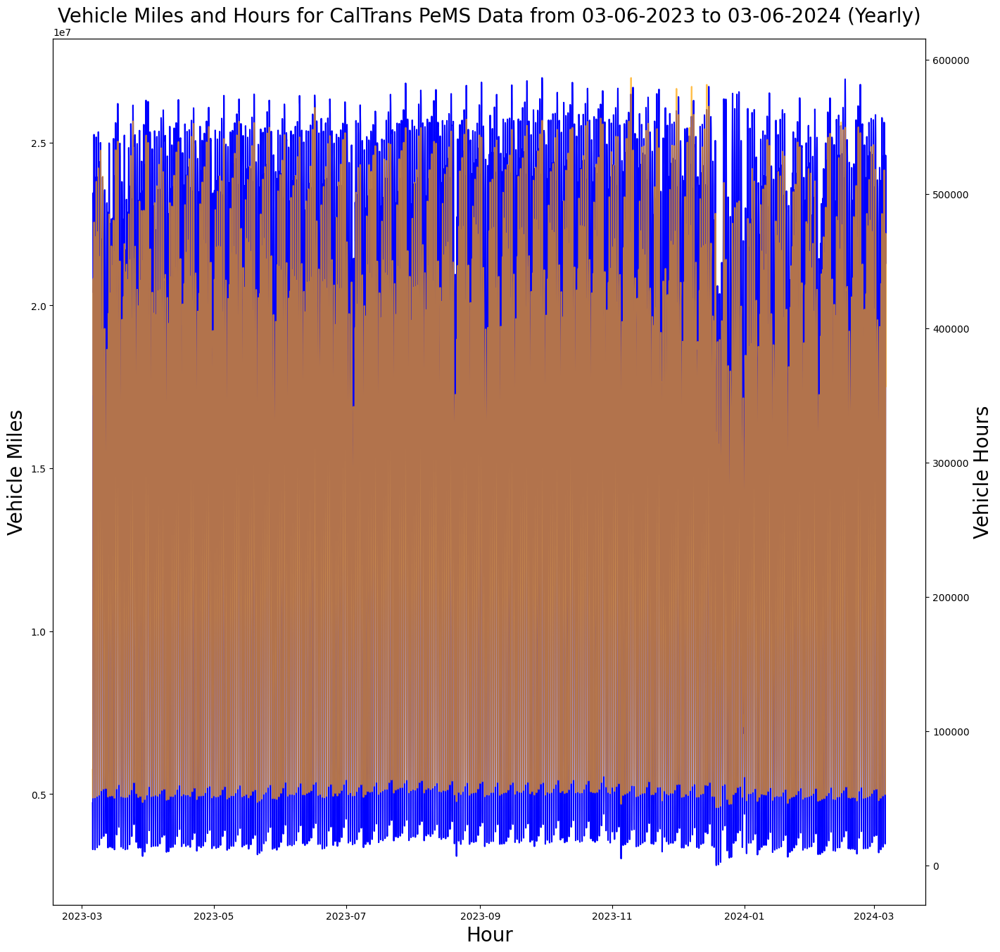

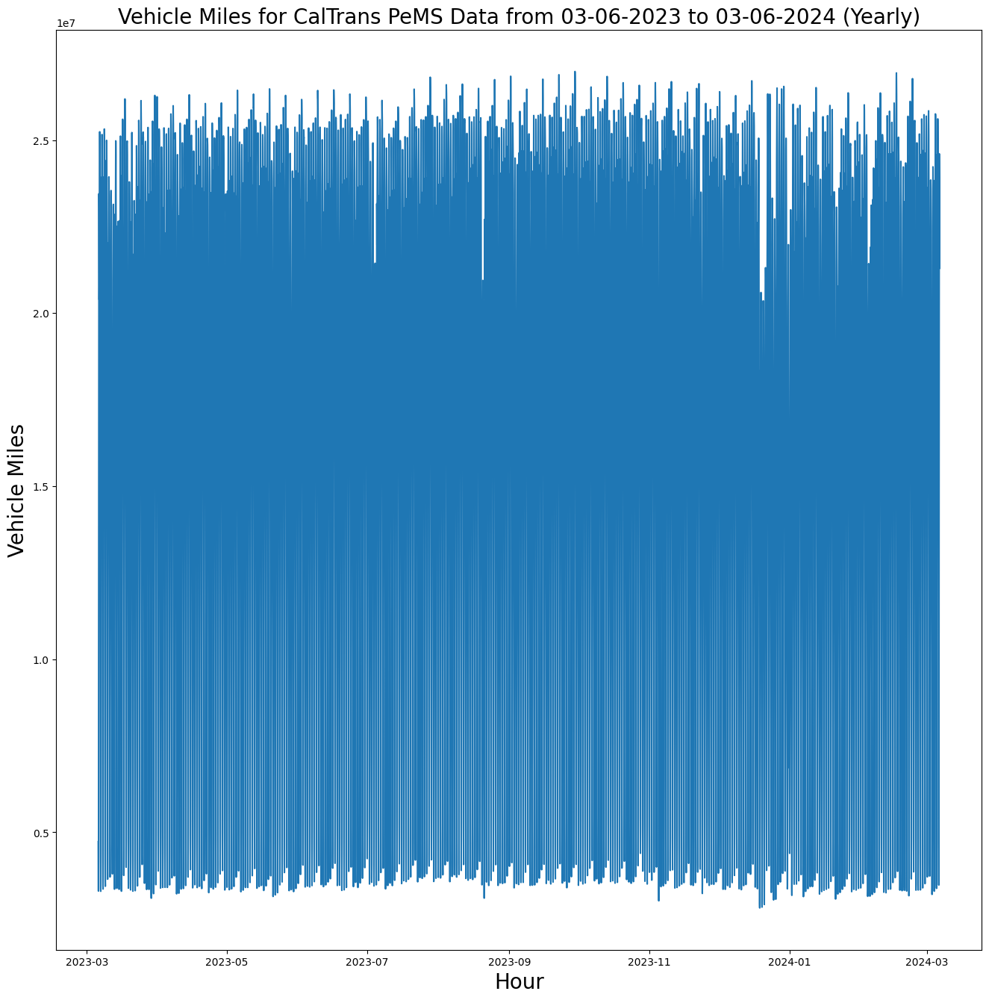

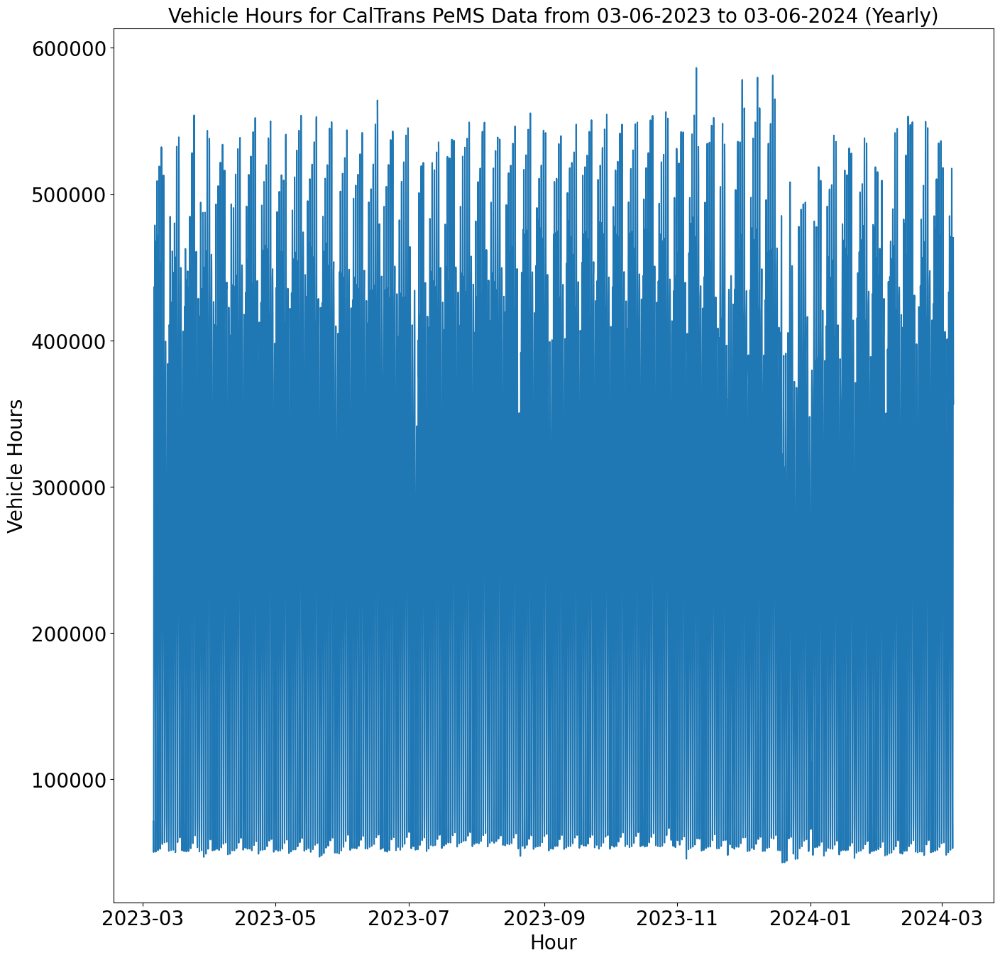

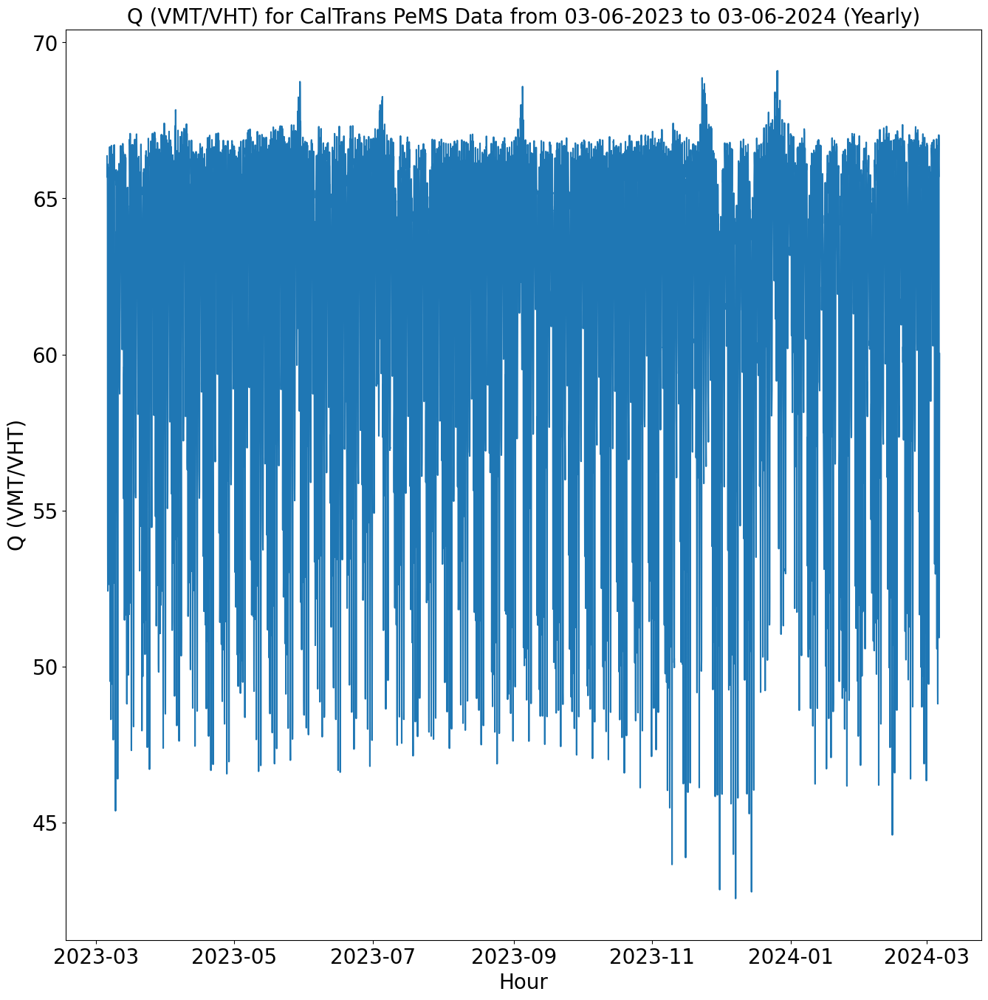

In [17]:
plot_veh_mi_hrs(df, 0, df.shape[0], "Yearly", title_name)
plot_veh_mi_hrs_Q(df['VMT (Veh-Miles)'], 0, df.shape[0], "Yearly", title_name,
                  'Vehicle Miles')
plot_veh_mi_hrs_Q(df['VHT (Veh-Hours)'], 0, df.shape[0], "Yearly", title_name,
                  'Vehicle Hours')
plot_veh_mi_hrs_Q(df['Q (VMT/VHT)'], 0, df.shape[0], "Yearly", title_name,
                  'Q (VMT/VHT)')

### Daily Plots (Seasonality)

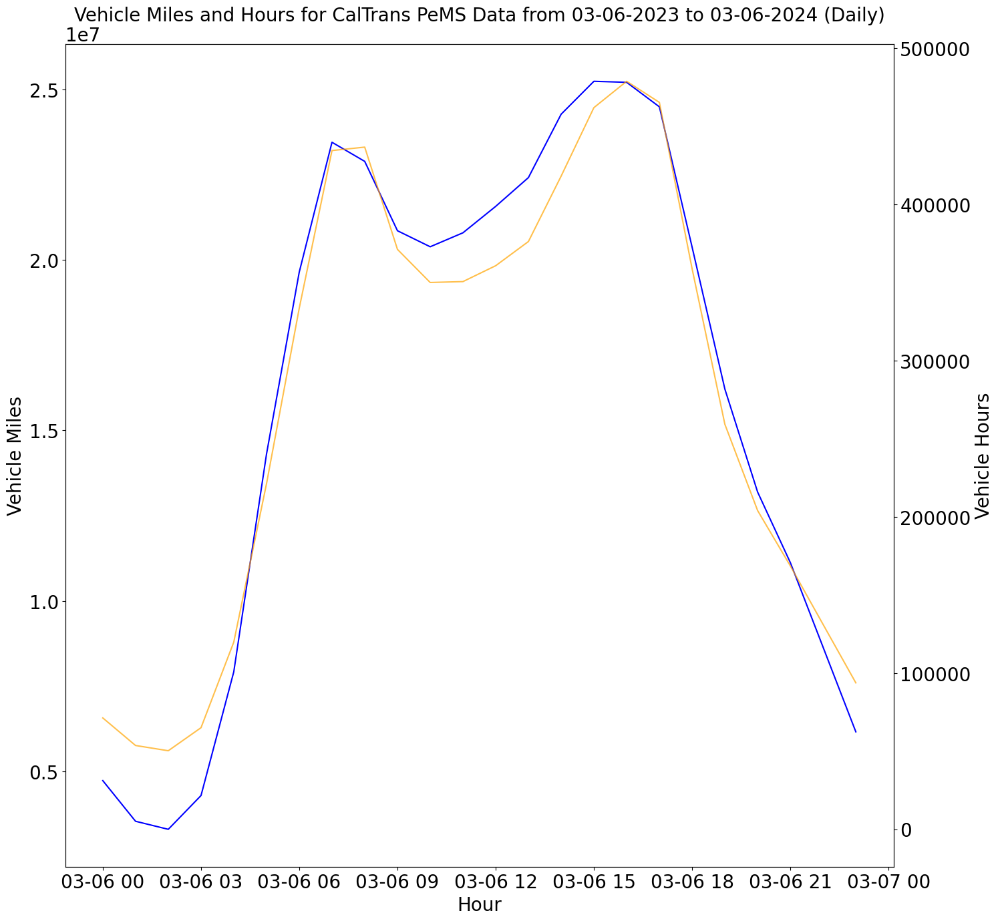

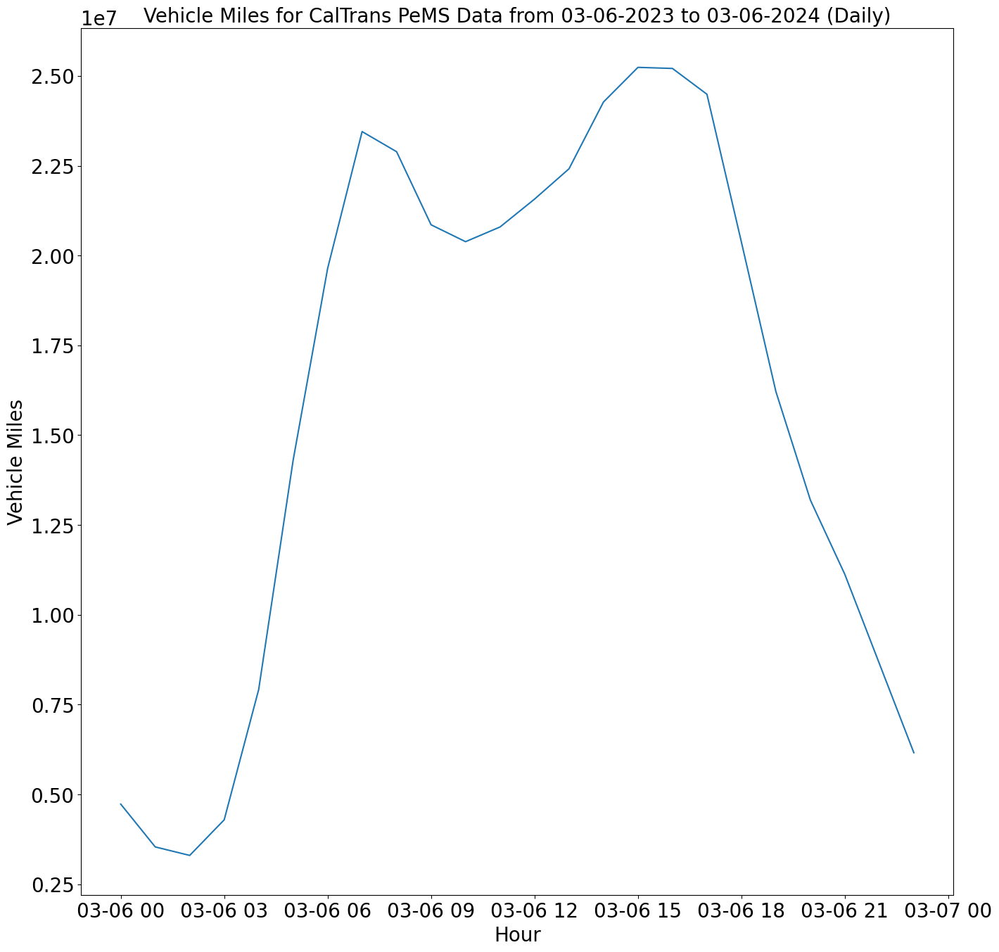

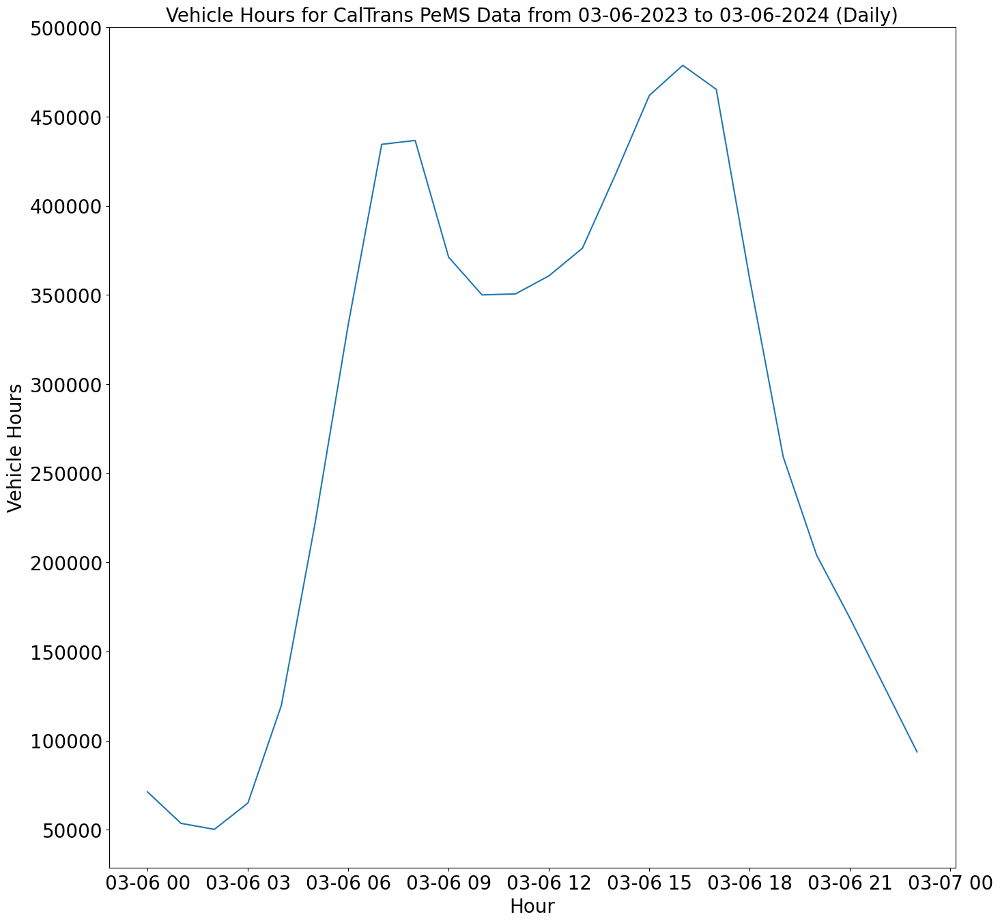

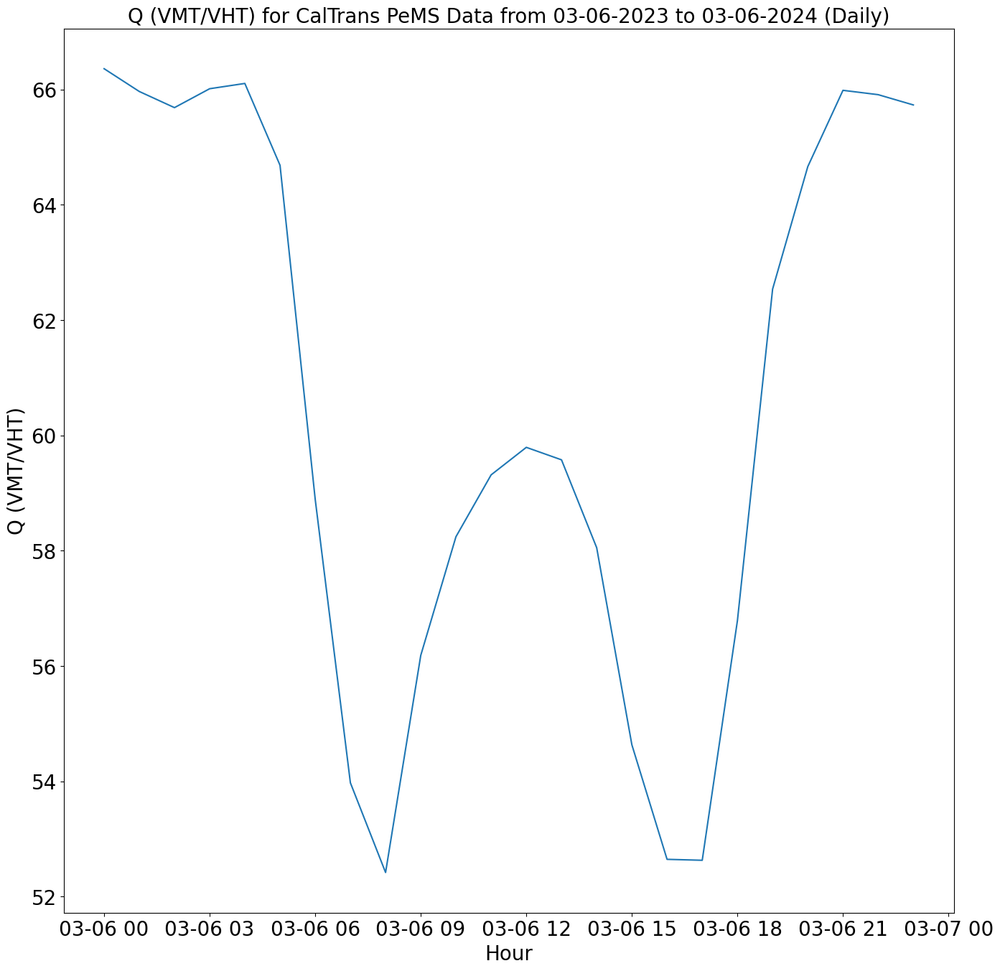

In [18]:
plot_veh_mi_hrs(df, 0, 24, "Daily", title_name)
plot_veh_mi_hrs_Q(df['VMT (Veh-Miles)'], 0, 24, "Daily", title_name,
                  'Vehicle Miles')
plot_veh_mi_hrs_Q(df['VHT (Veh-Hours)'], 0, 24, "Daily", title_name,
                  'Vehicle Hours')
plot_veh_mi_hrs_Q(df['Q (VMT/VHT)'], 0, 24, "Daily", title_name, 'Q (VMT/VHT)')

### Weekly Plots (Seasonality)

In [19]:
weekly_df = df.query("Hour >= '2023-04-09' \
                       and Hour <= '2023-04-16'")
weekly_df

,VMT (Veh-Miles),VHT (Veh-Hours),Q (VMT/VHT),# Lane Points,% Observed
Hour,,,,,
2023-04-09 00:00:00,7338493.3,109208.5,67.197089,431550,57.0
2023-04-09 01:00:00,5093904.2,76290.6,66.769749,431640,57.0
2023-04-09 02:00:00,4049969.8,60785.5,66.627235,431640,57.0
2023-04-09 03:00:00,3223051.7,48650.7,66.248825,431646,57.0
2023-04-09 04:00:00,3293754.2,49713.6,66.254590,431624,57.0
...,...,...,...,...,...
2023-04-15 20:00:00,17747047.8,276707.1,64.136583,431697,57.0
2023-04-15 21:00:00,16665800.0,250957.2,66.408933,431680,56.9
2023-04-15 22:00:00,14581376.4,218670.8,66.681863,431670,56.9


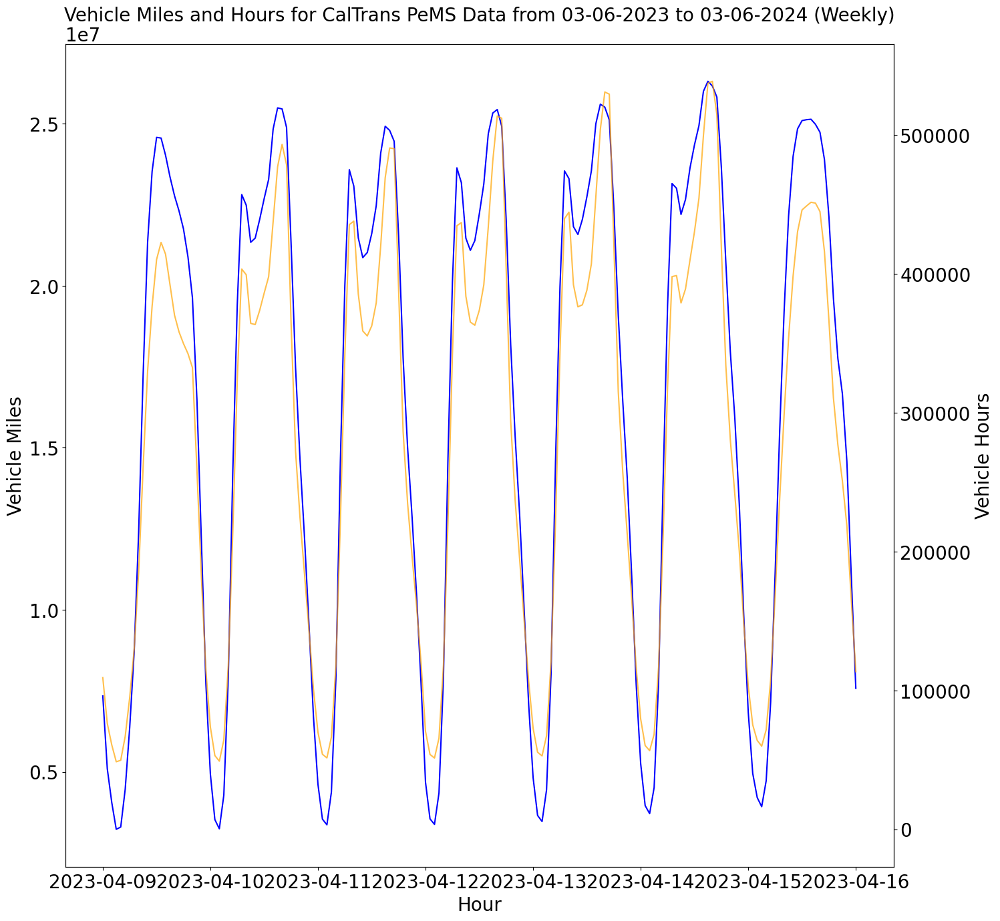

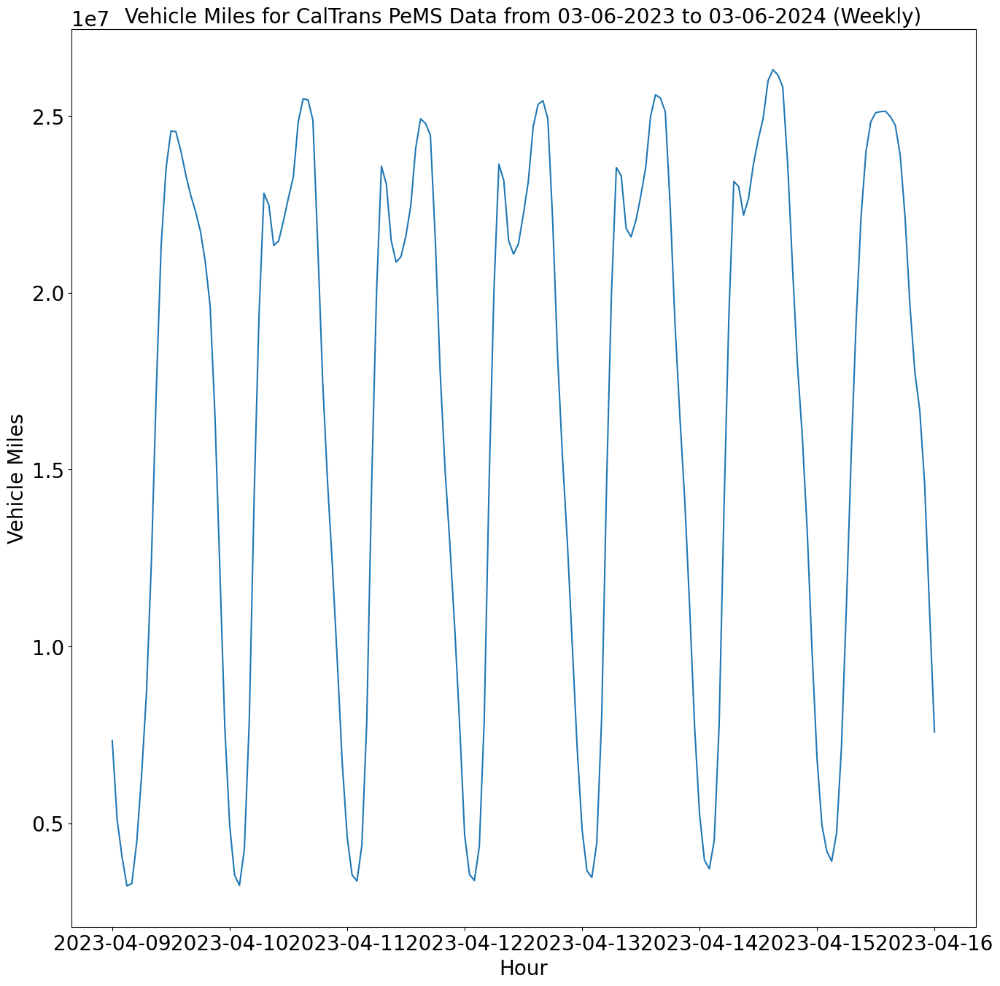

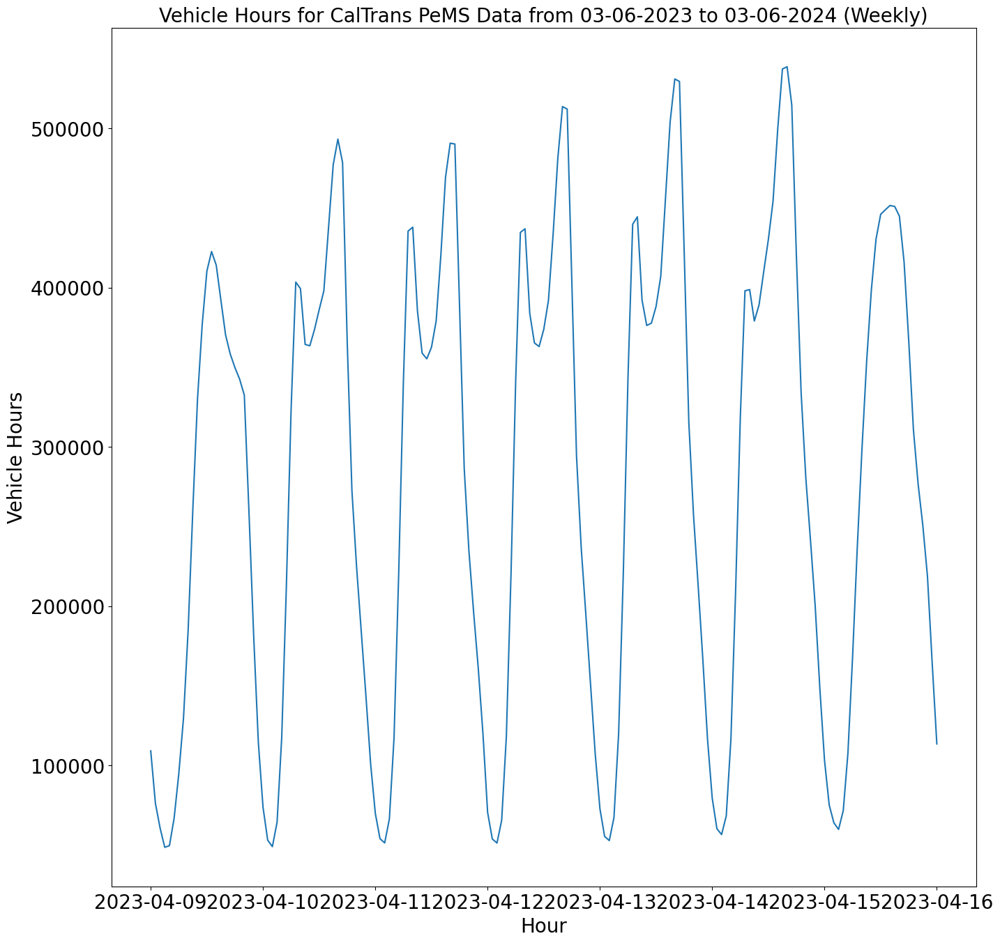

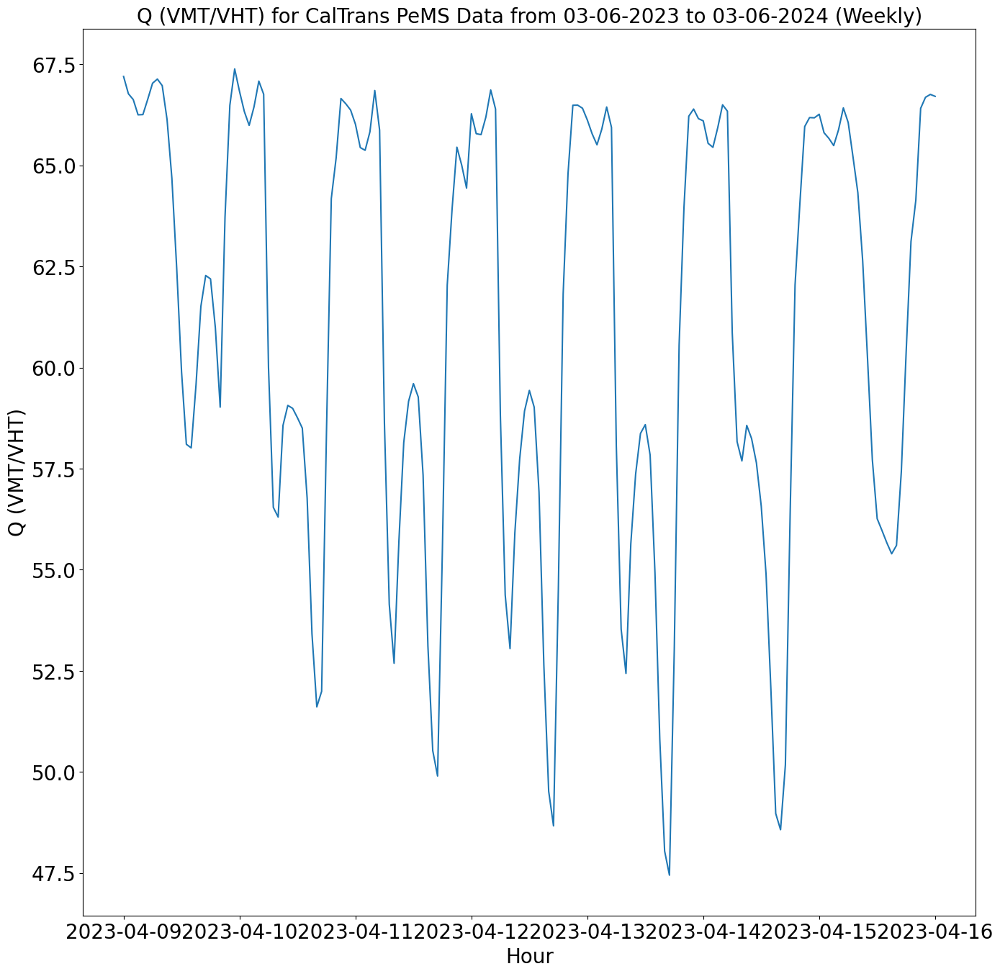

In [20]:
plot_veh_mi_hrs(weekly_df, 0, weekly_df.shape[0], "Weekly", title_name)
plot_veh_mi_hrs_Q(weekly_df['VMT (Veh-Miles)'], 0, weekly_df.shape[0], "Weekly",
                  title_name, 'Vehicle Miles')
plot_veh_mi_hrs_Q(weekly_df['VHT (Veh-Hours)'], 0, weekly_df.shape[0], "Weekly",
                  title_name, 'Vehicle Hours')
plot_veh_mi_hrs_Q(weekly_df['Q (VMT/VHT)'], 0, weekly_df.shape[0], "Weekly",
                  title_name, 'Q (VMT/VHT)')

### Monthly Plots (Seasonality)

In [21]:
monthly_df = df.query("Hour >= '2023-05-01' \
                       and Hour <= '2023-06-01'")

monthly_df

,VMT (Veh-Miles),VHT (Veh-Hours),Q (VMT/VHT),# Lane Points,% Observed
Hour,,,,,
2023-05-01 00:00:00,5026912.3,75439.4,66.635104,431709,52.5
2023-05-01 01:00:00,3701062.9,55985.2,66.107880,431704,52.5
2023-05-01 02:00:00,3414046.6,51859.2,65.832998,431698,52.5
2023-05-01 03:00:00,4413611.8,66772.5,66.099244,431704,52.4
2023-05-01 04:00:00,8122783.4,122095.1,66.528332,431719,52.4
...,...,...,...,...,...
2023-05-31 20:00:00,15473197.3,238845.5,64.783290,431647,48.7
2023-05-31 21:00:00,13272015.7,199268.5,66.603681,431741,48.7
2023-05-31 22:00:00,10321713.0,154610.6,66.759414,431748,48.5


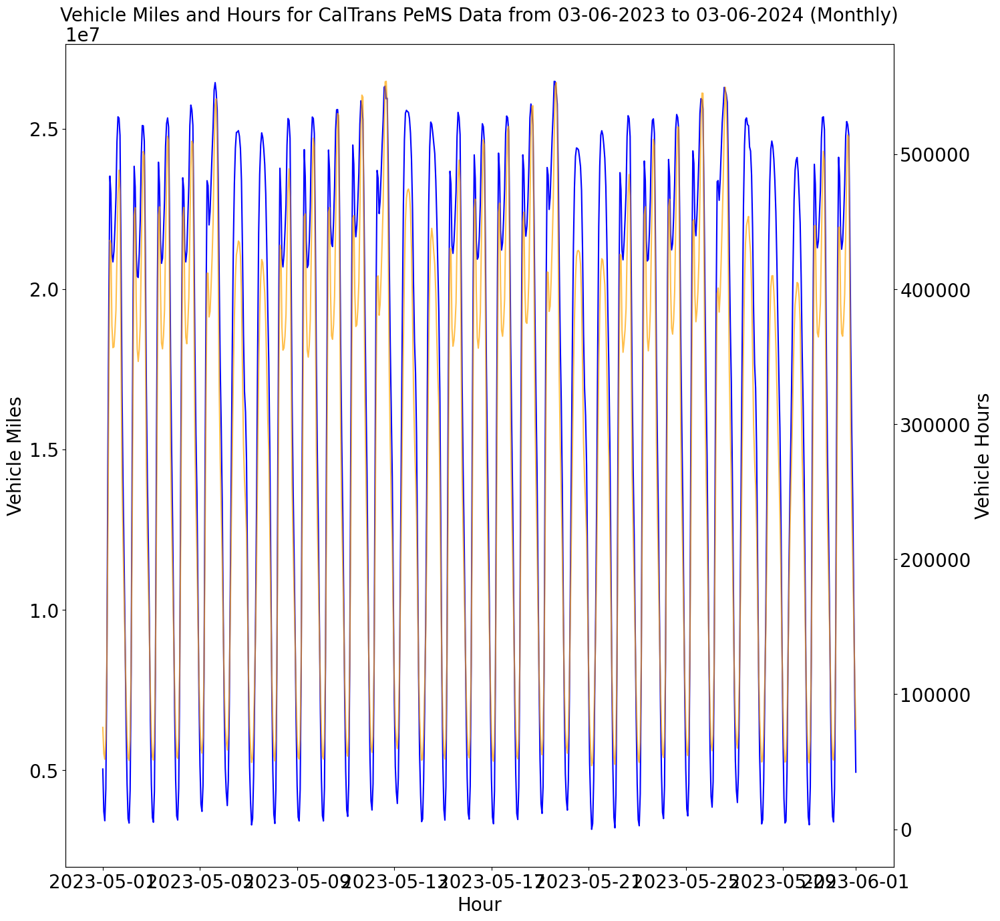

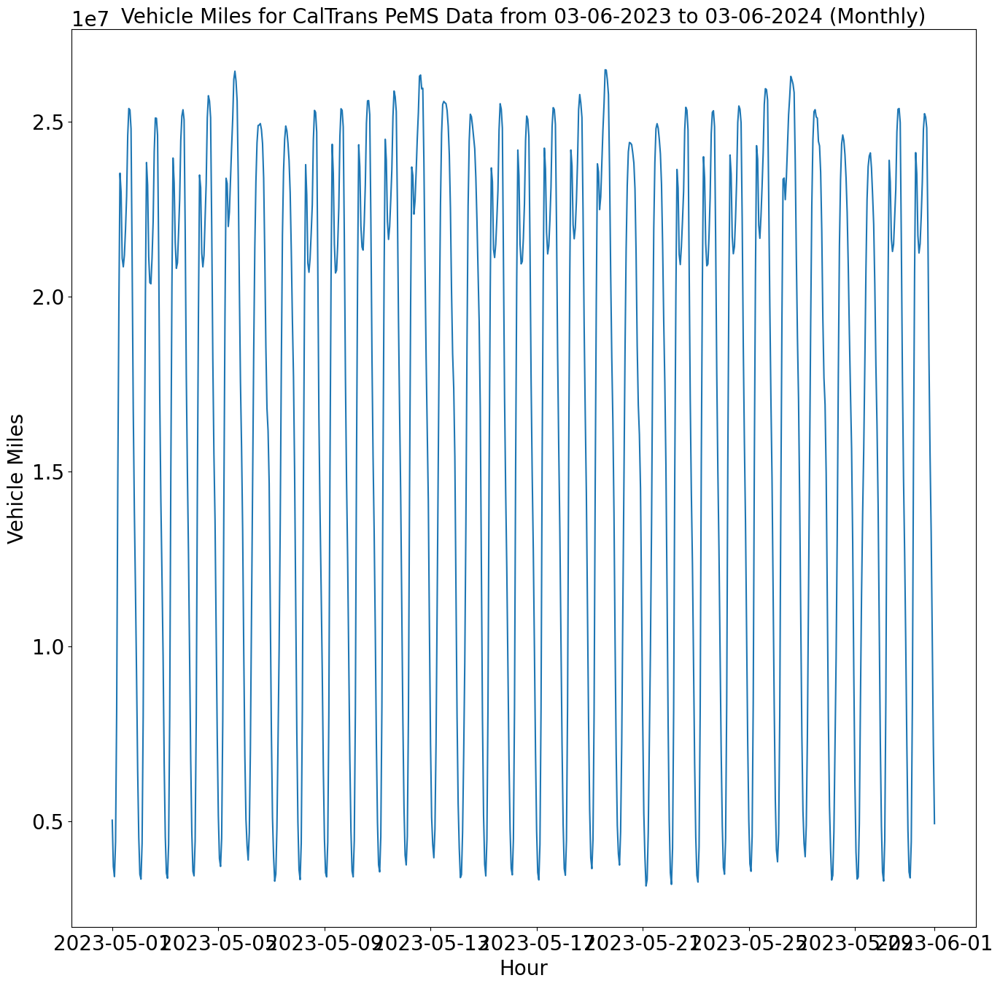

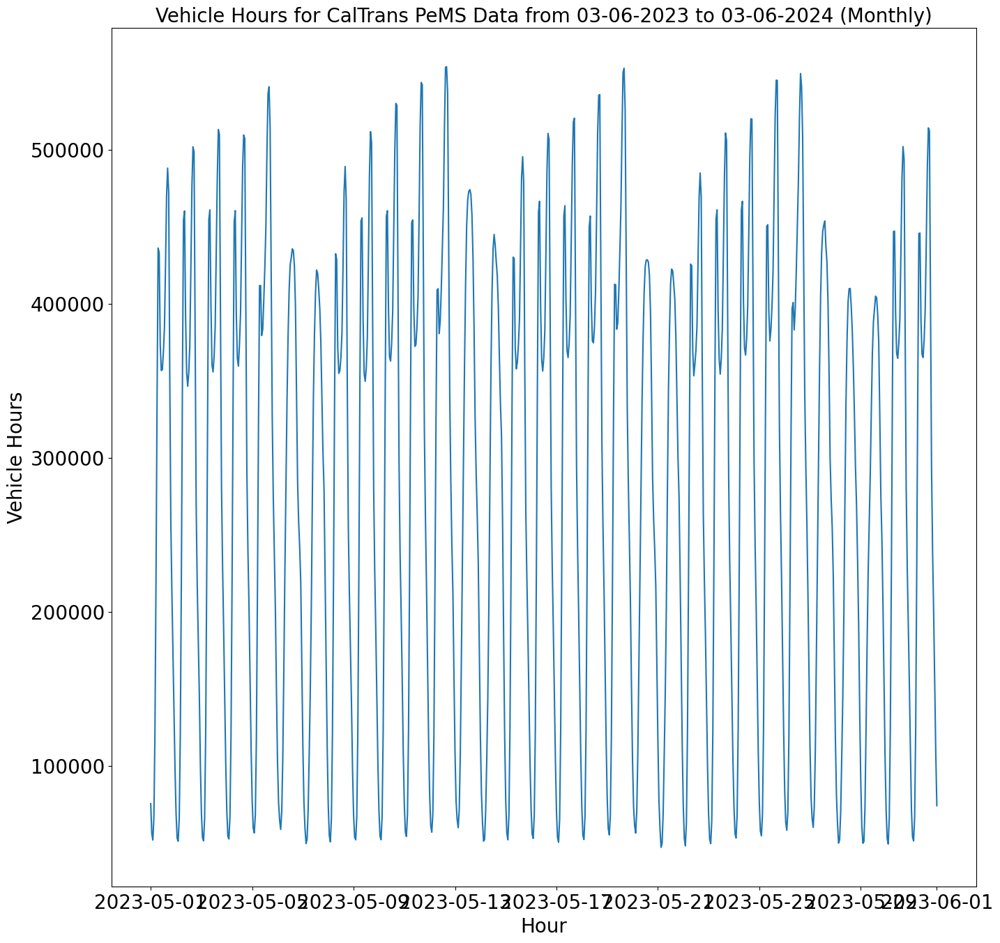

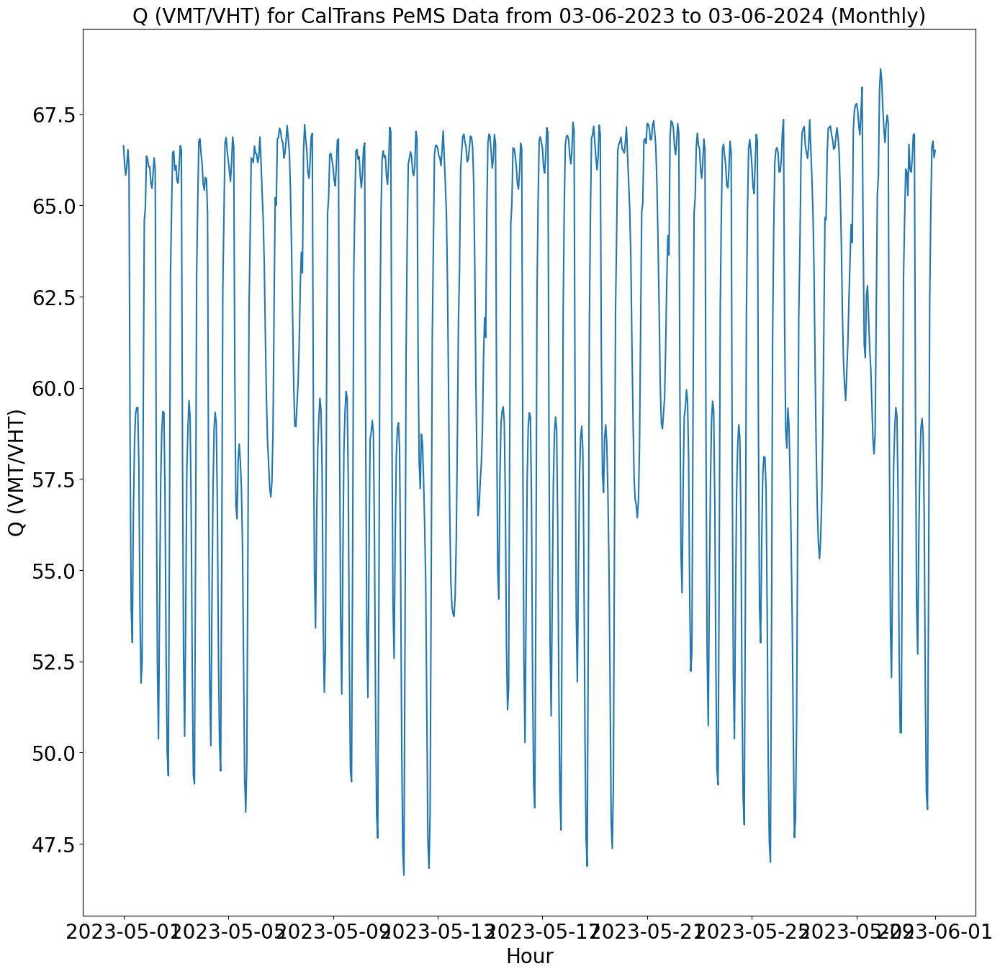

In [22]:
plot_veh_mi_hrs(monthly_df, 0, monthly_df.shape[0], "Monthly", title_name)
plot_veh_mi_hrs_Q(monthly_df['VMT (Veh-Miles)'], 0, monthly_df.shape[0],
                  "Monthly", title_name, 'Vehicle Miles')
plot_veh_mi_hrs_Q(monthly_df['VHT (Veh-Hours)'], 0, monthly_df.shape[0],
                  "Monthly", title_name, 'Vehicle Hours')
plot_veh_mi_hrs_Q(monthly_df['Q (VMT/VHT)'], 0, monthly_df.shape[0], "Monthly",
                  title_name, 'Q (VMT/VHT)')

# Normalization Process

In [23]:
def get_scaler(scaler):
    scalers = {
        "minmax": MinMaxScaler,
        "standard": StandardScaler,
        "maxabs": MaxAbsScaler,
        "robust": RobustScaler,
    }
    return scalers.get(scaler.lower())()

def normalize_data(df):
    scaler_type = 'minmax'
    #scaler_type = input("Enter a scaler type (minmax,standard, maxabs, robust): ")
    if (scaler_type != 'minmax') and (scaler_type != 'standard') and (scaler_type != 'maxabs') and (scaler_type != 'robust'):
      runtime.unassign()

    scaler = get_scaler(scaler_type)
    normalized_data_vmt = scaler.fit_transform(df['VMT (Veh-Miles)'].
                                               values.reshape(-1,1))
    df['vmt_norm'] = normalized_data_vmt
    normalized_data_vht = scaler.fit_transform(df['VHT (Veh-Hours)'].
                                               values.reshape(-1,1))
    df['vht_norm'] = normalized_data_vht
    normalized_data_Q = scaler.fit_transform(df['Q (VMT/VHT)'].
                                               values.reshape(-1,1))
    df['Q_norm'] = normalized_data_Q
    return df, scaler

df_norm, scaler = normalize_data(df)
df_norm_mon, scaler = normalize_data(monthly_df)
df_norm_wk, scaler = normalize_data(weekly_df)
df_norm_day, scaler = normalize_data(monthly_df)


In [24]:
df_norm

,VMT (Veh-Miles),VHT (Veh-Hours),Q (VMT/VHT),# Lane Points,% Observed,vmt_norm,vht_norm,Q_norm
Hour,,,,,,,,
2023-03-06 00:00:00,4730945.9,71292.8,66.359379,430583,55.0,0.079266,0.051819,0.896983
2023-03-06 01:00:00,3539705.6,53661.0,65.964212,430728,55.0,0.029970,0.019358,0.882088
2023-03-06 02:00:00,3303421.8,50292.4,65.684314,430476,54.9,0.020192,0.013156,0.871538
2023-03-06 03:00:00,4293866.2,65046.6,66.012154,430728,54.9,0.061179,0.040319,0.883895
2023-03-06 04:00:00,7919316.8,119801.6,66.103598,430728,54.8,0.211209,0.141126,0.887342
...,...,...,...,...,...,...,...,...
2024-03-06 07:00:00,24603494.5,463279.8,53.107203,443975,54.1,0.901642,0.773489,0.397474
2024-03-06 08:00:00,23952196.6,470345.1,50.924729,443974,54.2,0.874690,0.786497,0.315210
2024-03-06 09:00:00,22128475.5,404745.4,54.672581,444146,53.0,0.799220,0.665724,0.456477


## Plot VMT, VHT, Q Normalized based on Trend and Seasonality.

Now after normalization we can observe that the data range on y-axis is 0.0 - 1.0.

### Yearly Plots (Trend)

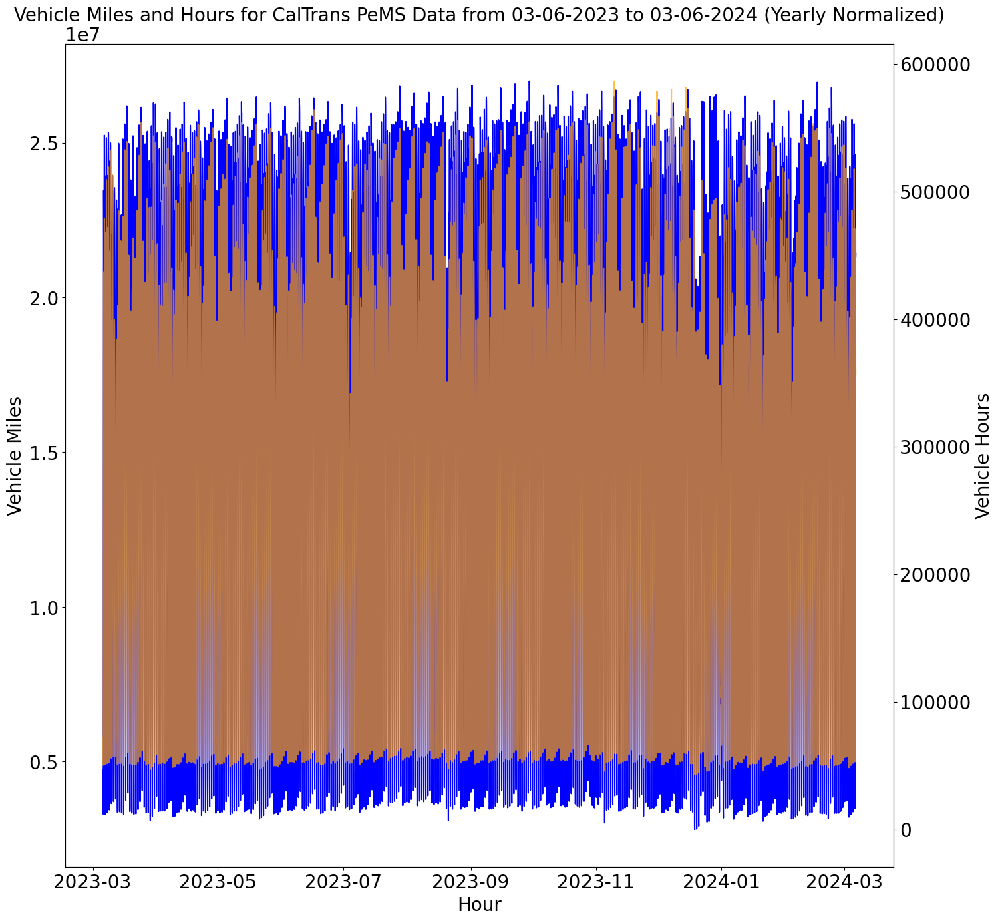

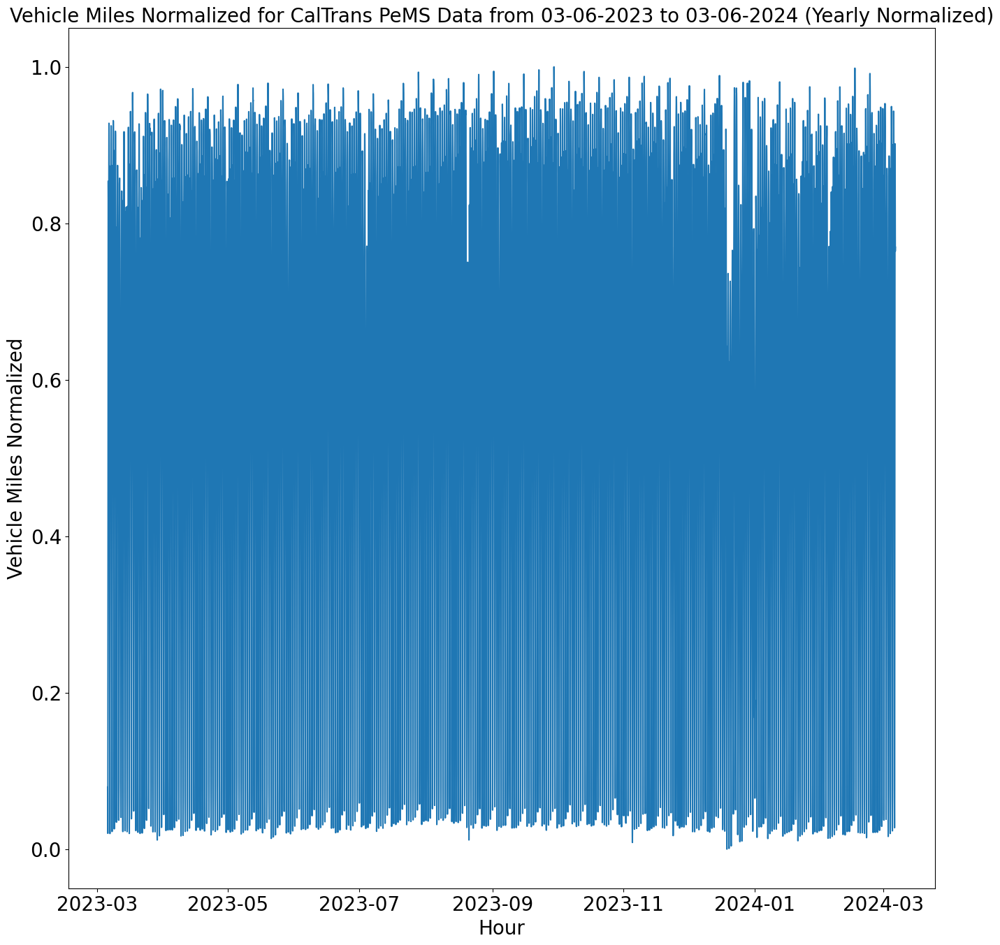

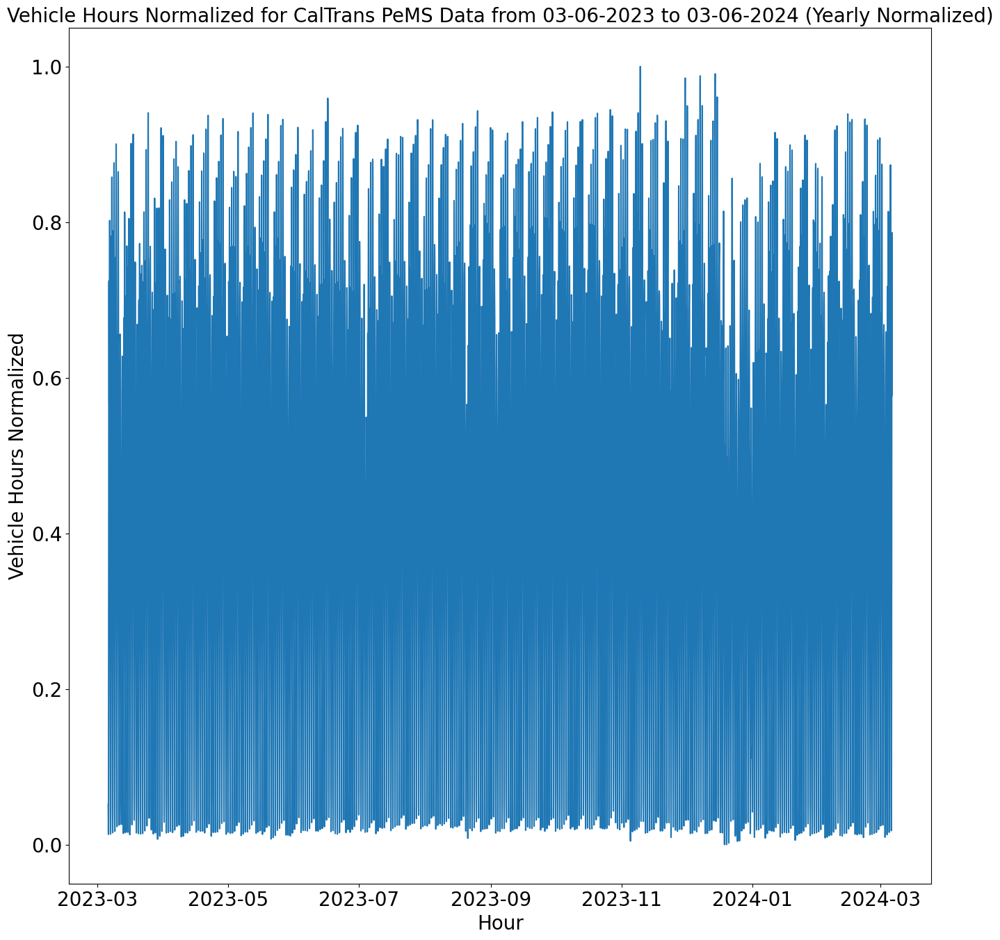

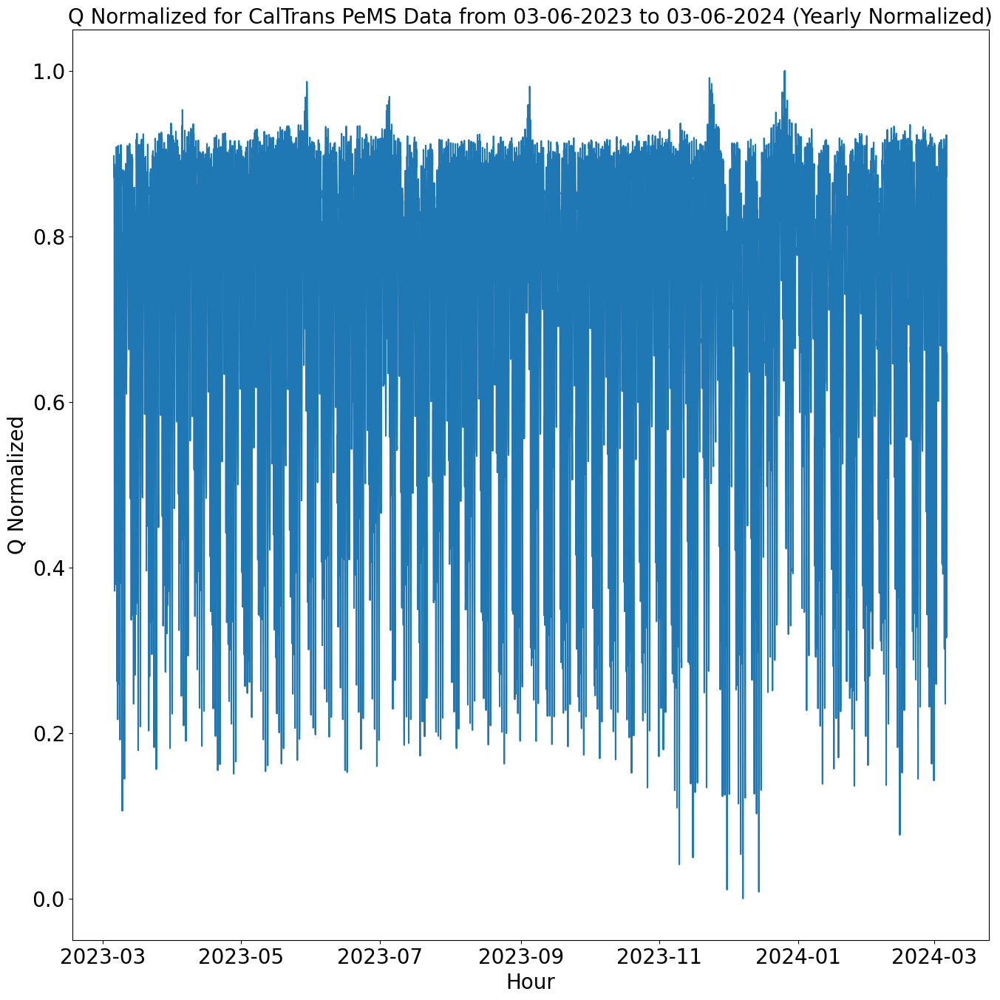

In [25]:
plot_veh_mi_hrs(df_norm, 0, df_norm.shape[0], 'Yearly Normalized', title_name)
plot_veh_mi_hrs_Q(df_norm['vmt_norm'], 0, df_norm.shape[0], 'Yearly Normalized',
                  title_name, 'Vehicle Miles Normalized')
plot_veh_mi_hrs_Q(df_norm['vht_norm'], 0, df_norm.shape[0], 'Yearly Normalized',
                  title_name, 'Vehicle Hours Normalized')
plot_veh_mi_hrs_Q(df_norm['Q_norm'], 0, df_norm.shape[0], 'Yearly Normalized',
                  title_name, 'Q Normalized')

### Daily Plots (Seasonality)

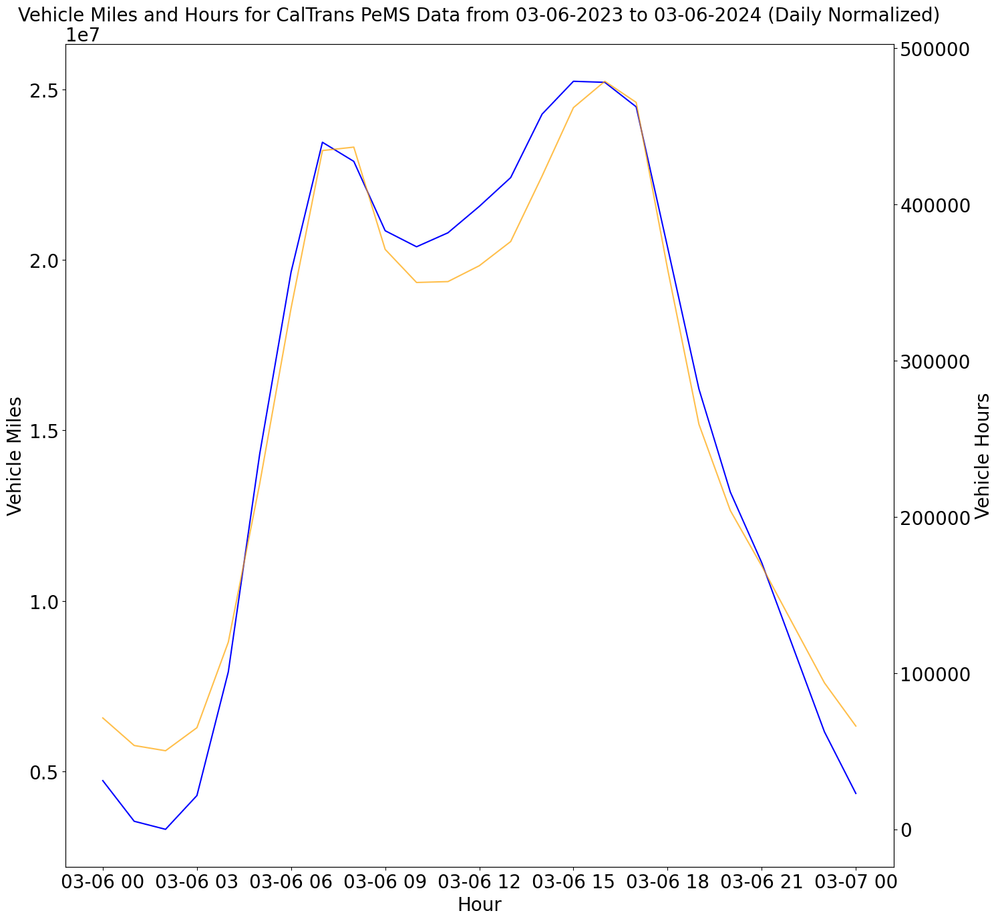

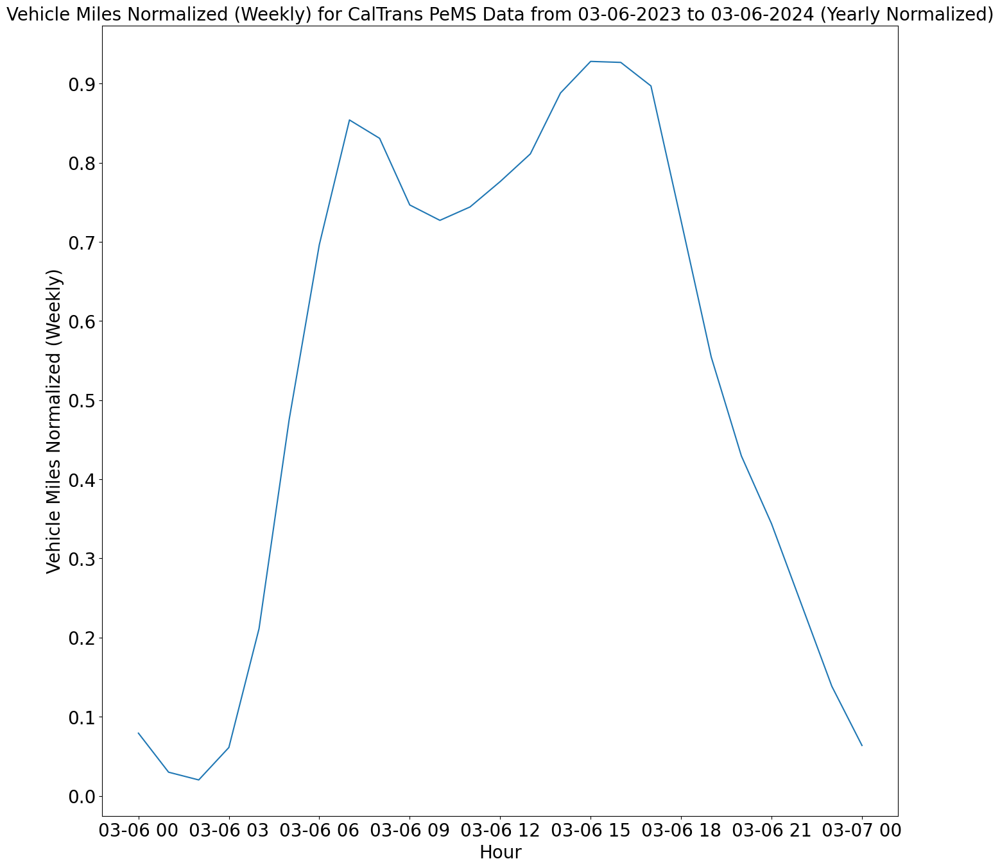

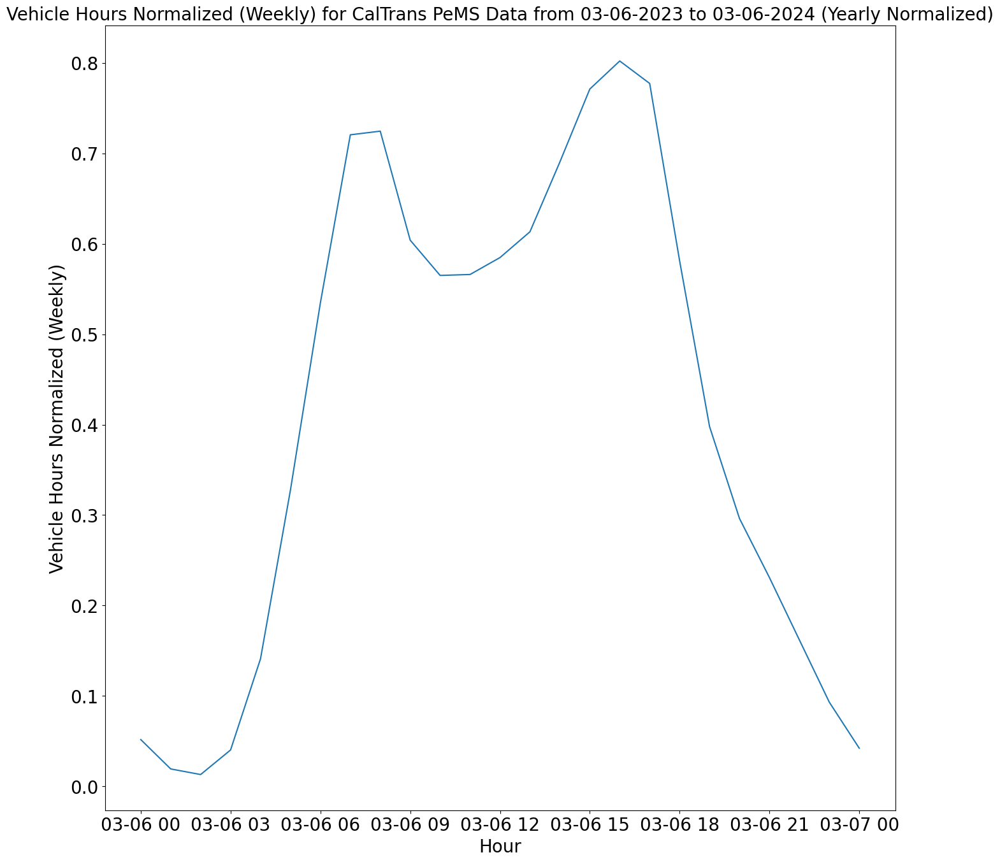

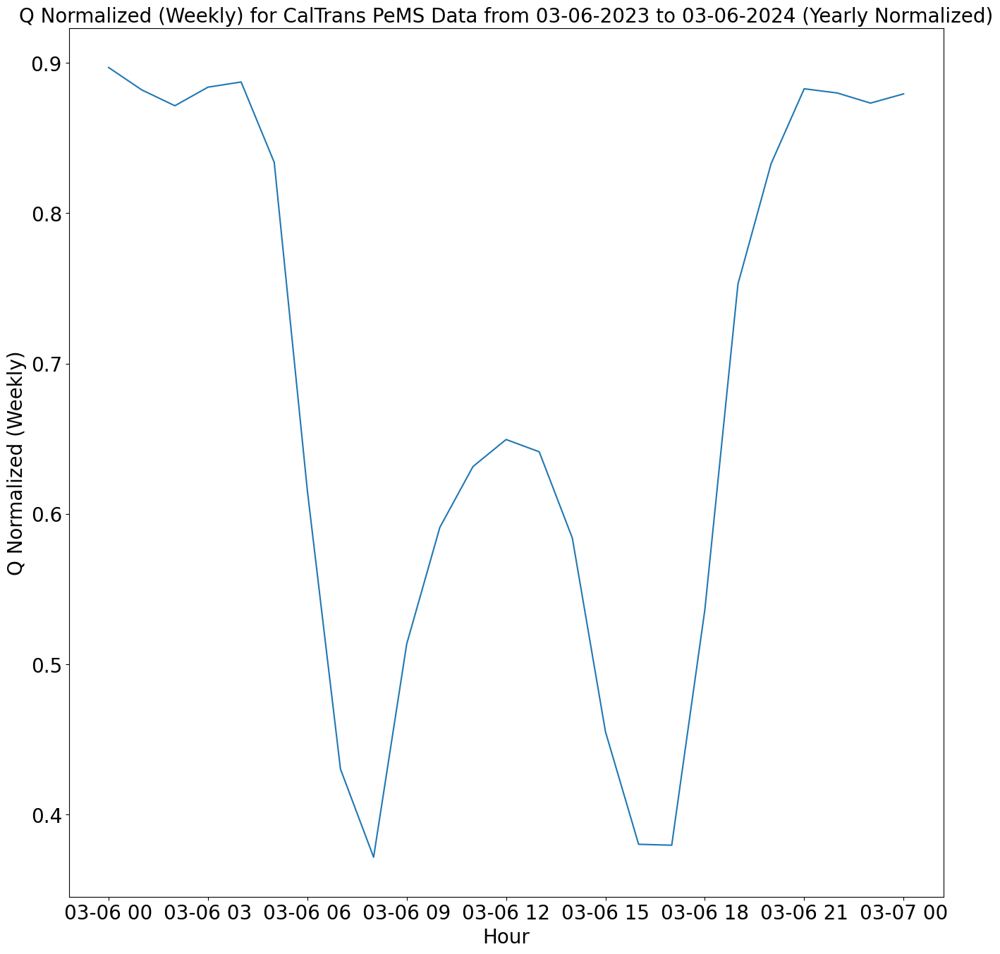

In [26]:
plot_veh_mi_hrs(df_norm, 0, 25, 'Daily Normalized', title_name)
plot_veh_mi_hrs_Q(df_norm['vmt_norm'], 0, 25, 'Yearly Normalized', title_name,
                  'Vehicle Miles Normalized (Weekly)')
plot_veh_mi_hrs_Q(df_norm['vht_norm'], 0, 25, 'Yearly Normalized', title_name,
                  'Vehicle Hours Normalized (Weekly)')
plot_veh_mi_hrs_Q(df_norm['Q_norm'], 0, 25, 'Yearly Normalized', title_name,
                  'Q Normalized (Weekly)')

### Weekly Plots (Seasonality)

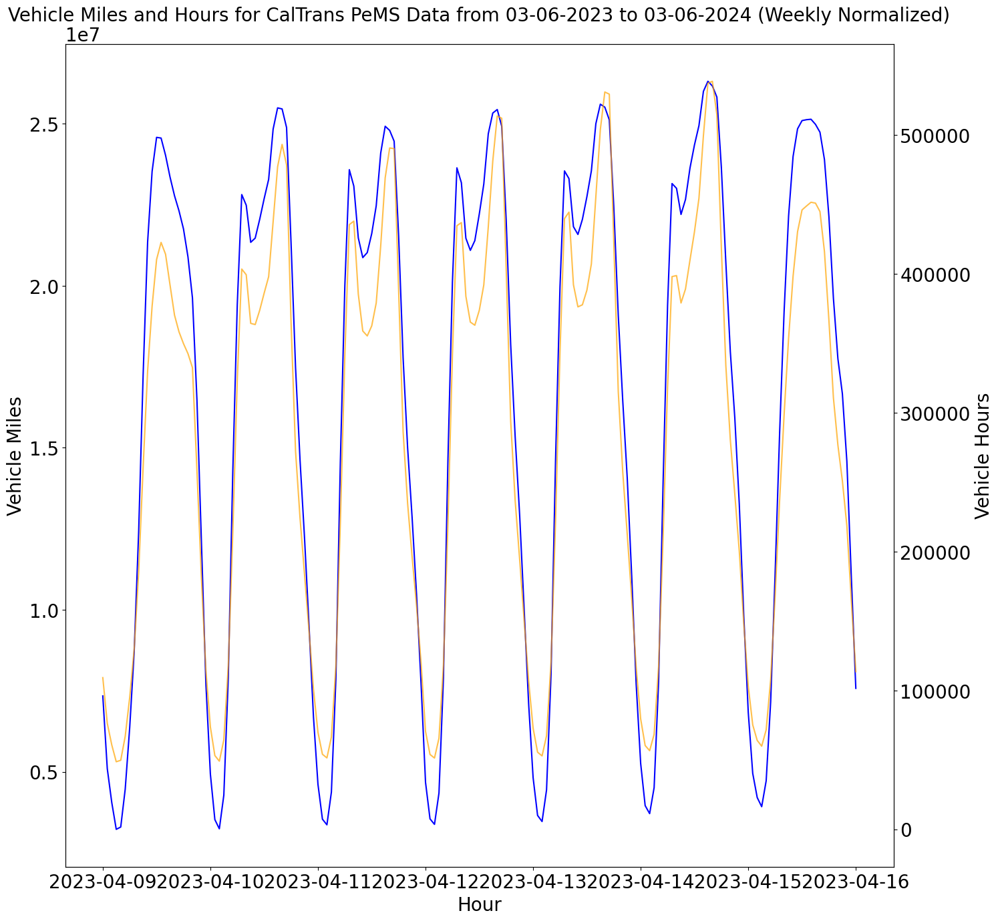

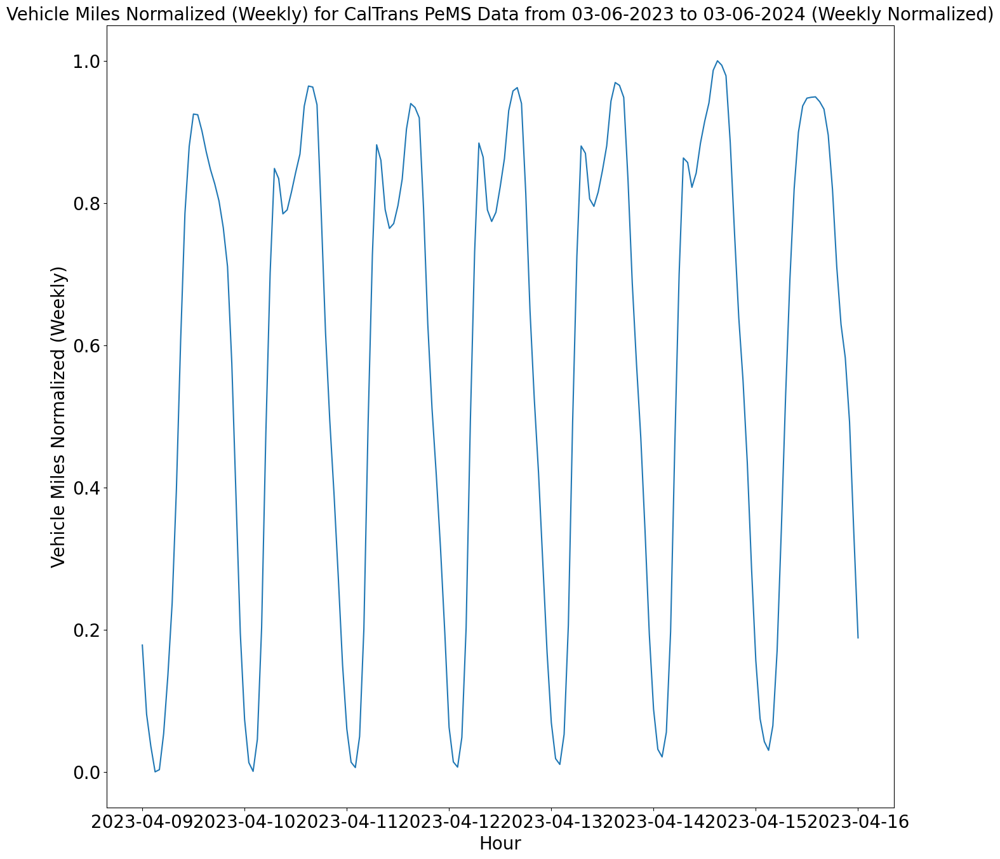

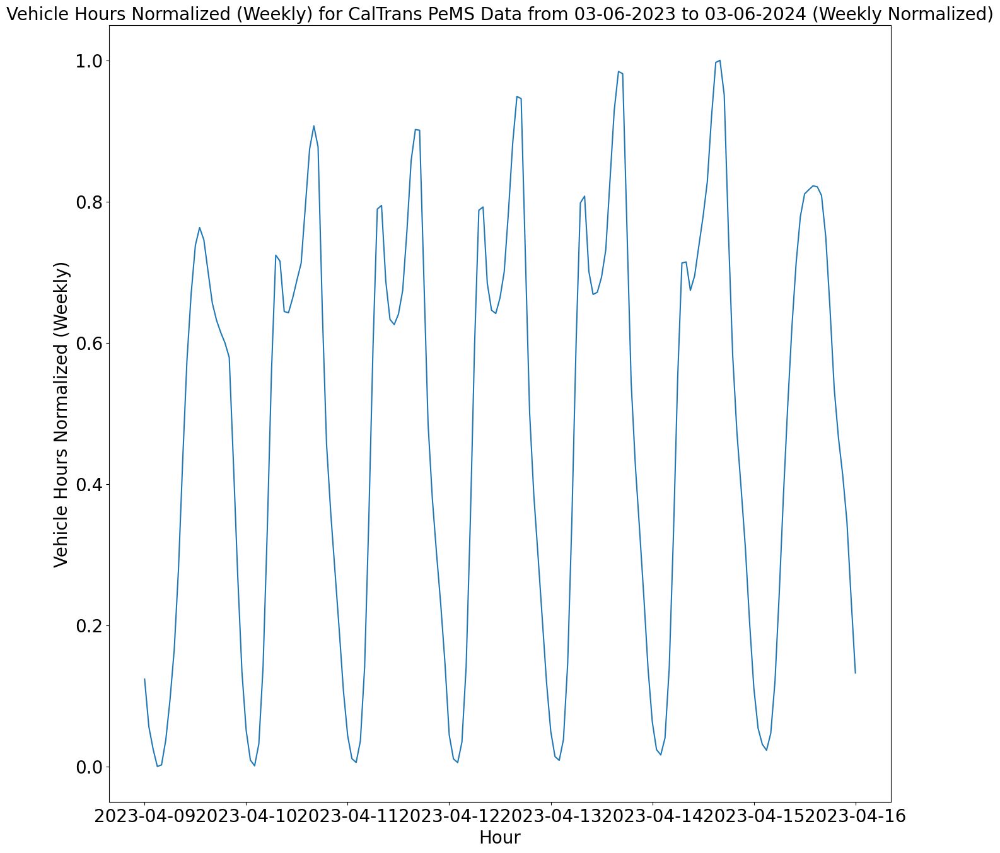

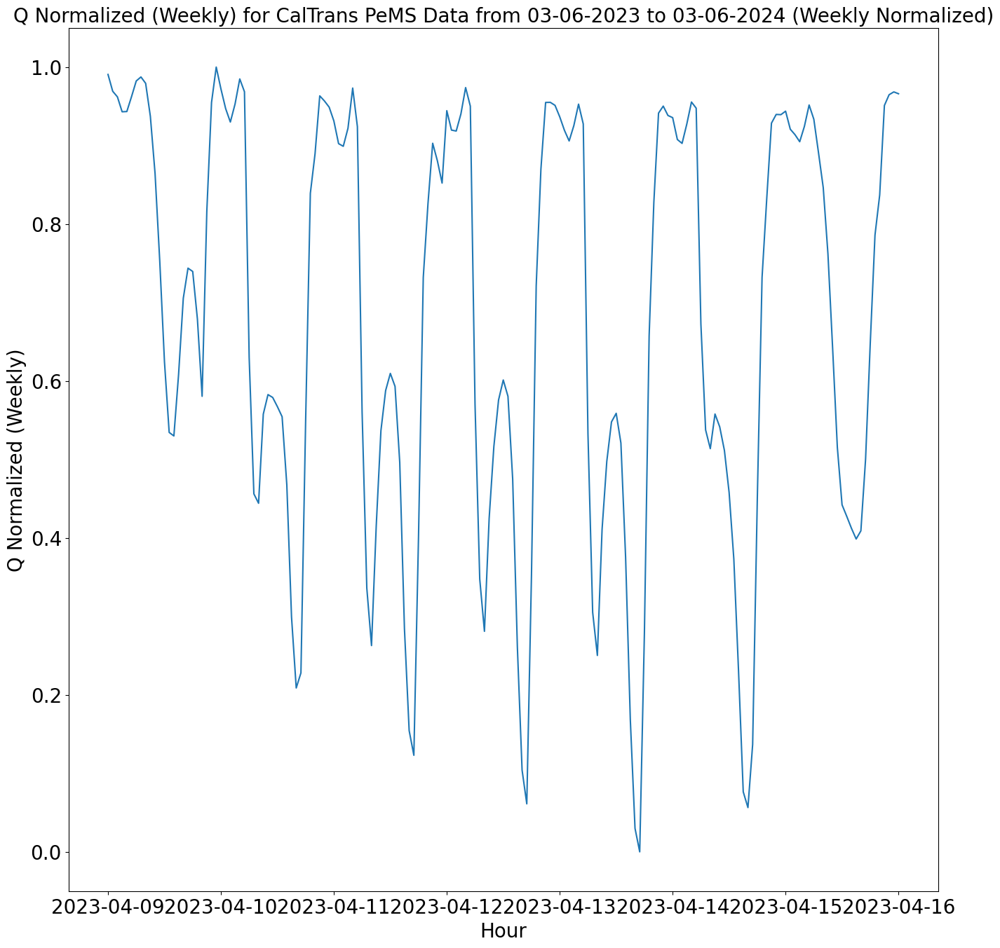

In [27]:
plot_veh_mi_hrs(df_norm_wk, 0, df_norm_wk.shape[0], 'Weekly Normalized',
                title_name)
plot_veh_mi_hrs_Q(df_norm_wk['vmt_norm'], 0, df_norm_wk.shape[0],
                  'Weekly Normalized', title_name,
                  'Vehicle Miles Normalized (Weekly)')
plot_veh_mi_hrs_Q(df_norm_wk['vht_norm'], 0, df_norm_wk.shape[0],
                  'Weekly Normalized', title_name,
                  'Vehicle Hours Normalized (Weekly)')
plot_veh_mi_hrs_Q(df_norm_wk['Q_norm'], 0, df_norm_wk.shape[0],
                  'Weekly Normalized', title_name, 'Q Normalized (Weekly)')

### Monthly Plots (Seasonality)

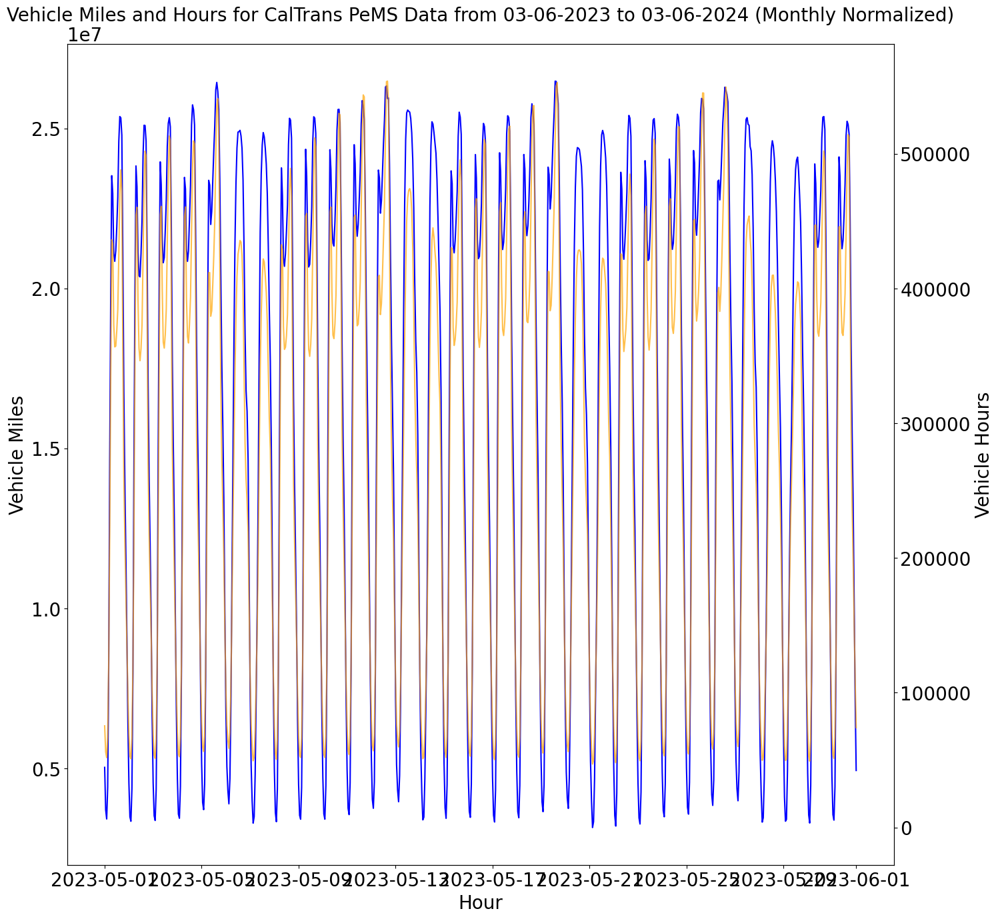

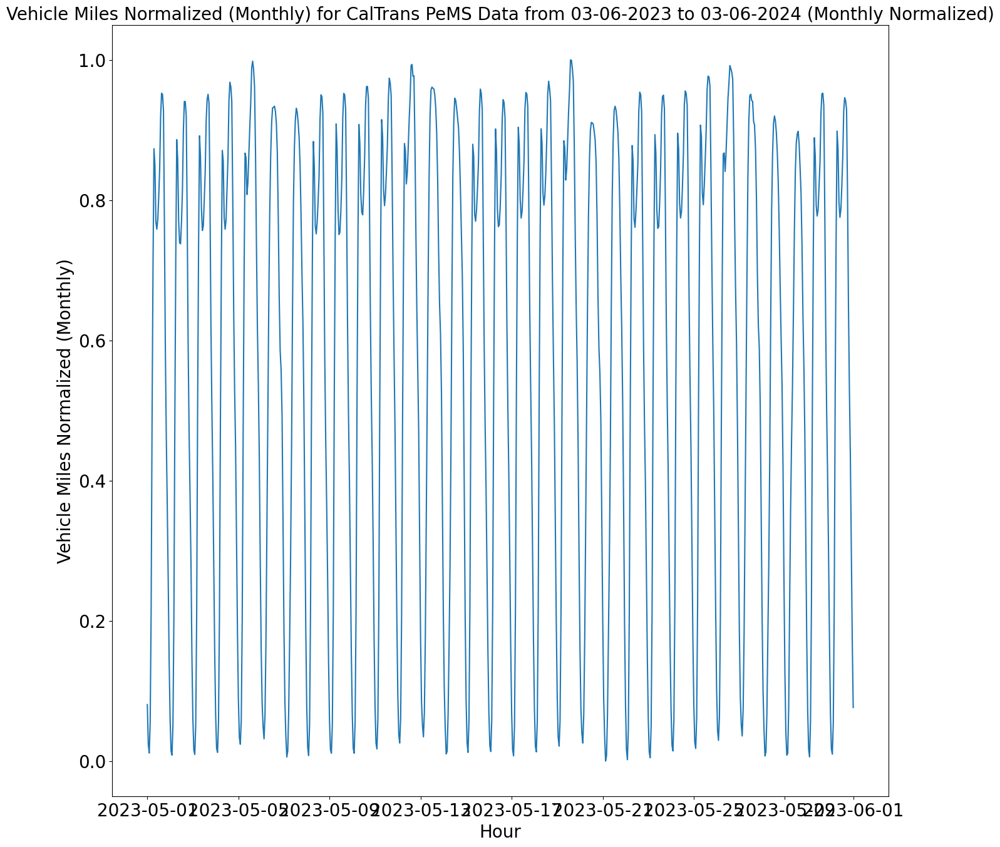

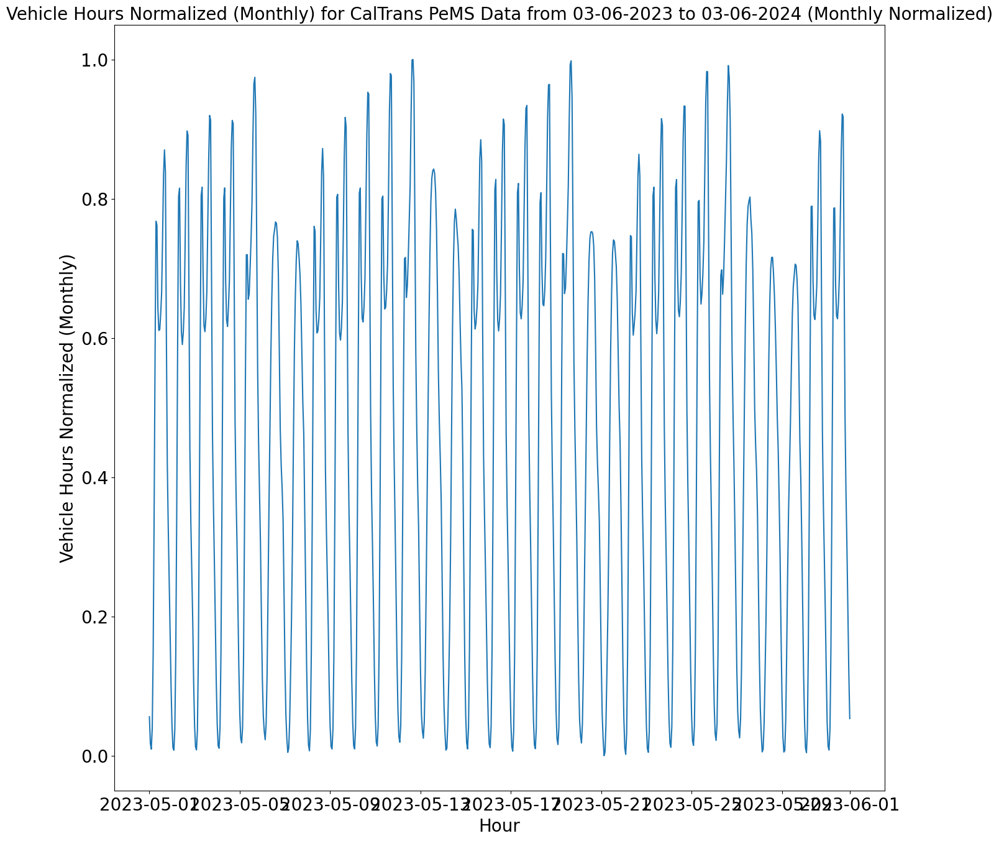

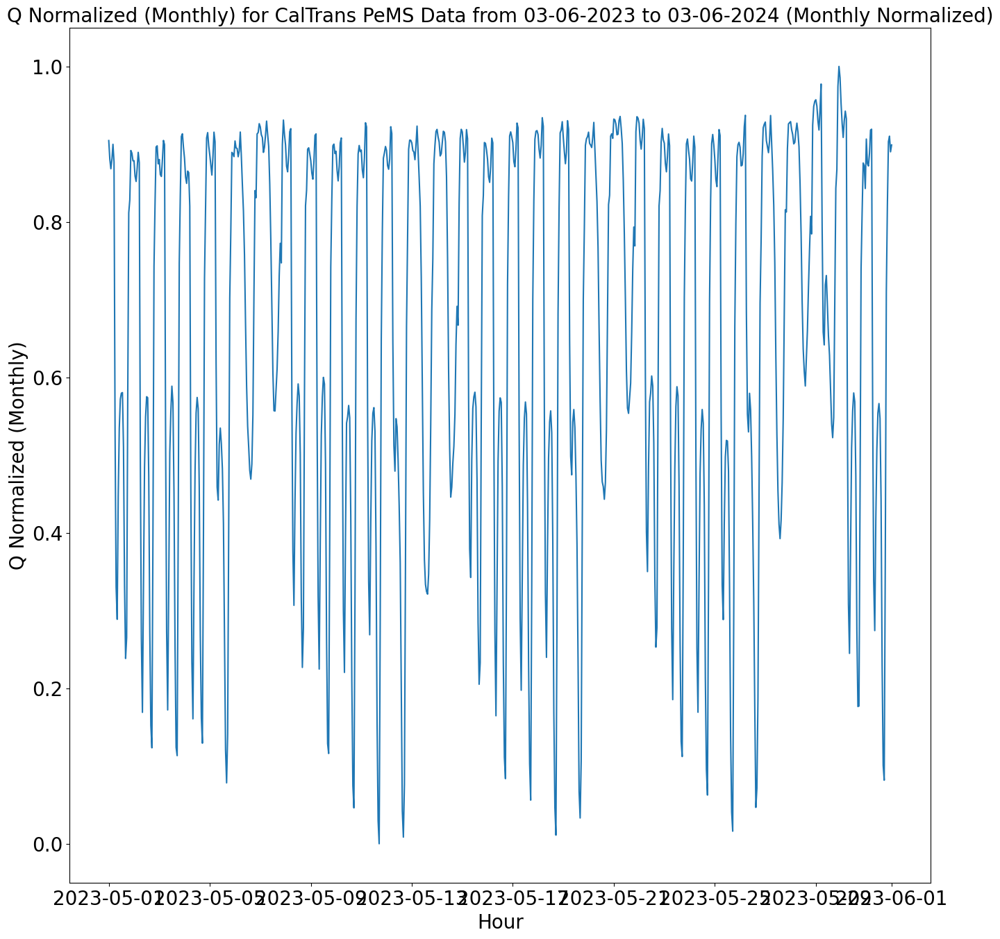

In [28]:
plot_veh_mi_hrs(df_norm_mon, 0, df_norm_mon.shape[0], 'Monthly Normalized',
                title_name)
plot_veh_mi_hrs_Q(df_norm_mon['vmt_norm'], 0, df_norm_mon.shape[0],
                  'Monthly Normalized', title_name,
                  'Vehicle Miles Normalized (Monthly)')
plot_veh_mi_hrs_Q(df_norm_mon['vht_norm'], 0, df_norm_mon.shape[0],
                  'Monthly Normalized', title_name,
                  'Vehicle Hours Normalized (Monthly)')
plot_veh_mi_hrs_Q(df_norm_mon['Q_norm'], 0, df_norm_mon.shape[0],
                  'Monthly Normalized', title_name,
                  'Q Normalized (Monthly)')

# Let's observe train and test data on the graph

## Split into Train/Test Data.

In [29]:
test_size = 0.2 # Set Split rate to 3:1 (80 % Training 20 % Test).
split_pos = int(df.shape[0]*(1 - test_size))
df = df.reset_index()
df

,Hour,VMT (Veh-Miles),VHT (Veh-Hours),Q (VMT/VHT),# Lane Points,% Observed,vmt_norm,vht_norm,Q_norm
0,2023-03-06 00:00:00,4730945.9,71292.8,66.359379,430583,55.0,0.079266,0.051819,0.896983
1,2023-03-06 01:00:00,3539705.6,53661.0,65.964212,430728,55.0,0.029970,0.019358,0.882088
2,2023-03-06 02:00:00,3303421.8,50292.4,65.684314,430476,54.9,0.020192,0.013156,0.871538
3,2023-03-06 03:00:00,4293866.2,65046.6,66.012154,430728,54.9,0.061179,0.040319,0.883895
4,2023-03-06 04:00:00,7919316.8,119801.6,66.103598,430728,54.8,0.211209,0.141126,0.887342
...,...,...,...,...,...,...,...,...,...
8790,2024-03-06 07:00:00,24603494.5,463279.8,53.107203,443975,54.1,0.901642,0.773489,0.397474
8791,2024-03-06 08:00:00,23952196.6,470345.1,50.924729,443974,54.2,0.874690,0.786497,0.315210
8792,2024-03-06 09:00:00,22128475.5,404745.4,54.672581,444146,53.0,0.799220,0.665724,0.456477
8793,2024-03-06 10:00:00,21287942.9,362457.5,58.732246,443929,49.3,0.764437,0.587870,0.609496


In [30]:
# 2019-02-06 will be the date seperation. Dates past this will be the test set.
split_date = str(df.Hour[split_pos])
#split_date = split_date[:10]
#DOM_train = df_norm.loc[df_norm.index <= split_date].copy()
DOM_train = df.loc[df_norm.index <= split_date].copy()
#DOM_test = df_norm.loc[df_norm.index > split_date].copy()
DOM_test = df.loc[df_norm.index > split_date].copy()
split_date

'2023-12-24 05:00:00'

## Plot Train/Test Split Graphs.

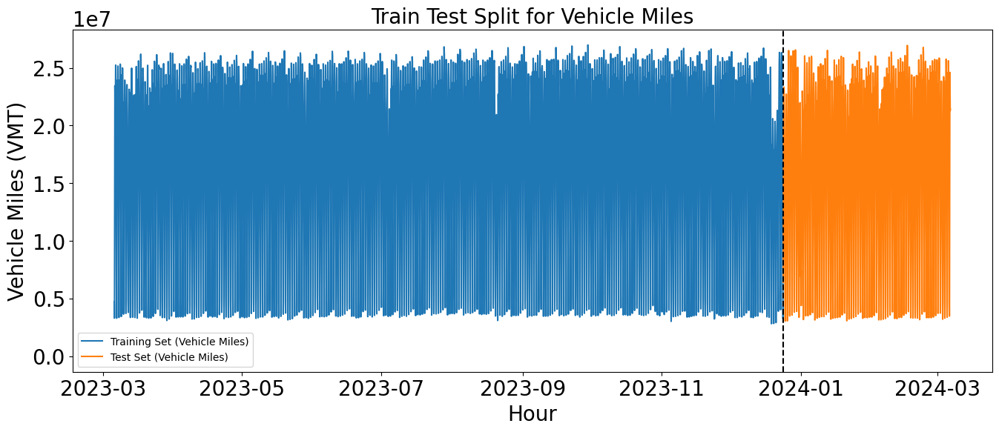

In [31]:
# Vehicle Miles
plt.figure(figsize=(16,6))
plt.plot(DOM_train['Hour'], DOM_train['VMT (Veh-Miles)'],
         label='Training Set (Vehicle Miles)')
plt.plot(DOM_test['Hour'], DOM_test['VMT (Veh-Miles)'],
         label='Testing Set (Vehicle Miles)')
plt.axvline(x = df.Hour[split_pos], color='black', ls='--')
plt.legend(['Training Set (Vehicle Miles)', 'Test Set (Vehicle Miles)'])
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.xlabel("Hour", fontsize = 20)
plt.ylabel("Vehicle Miles (VMT)", fontsize = 20)
plt.title("Train Test Split for Vehicle Miles", fontsize = 20)
plt.show()

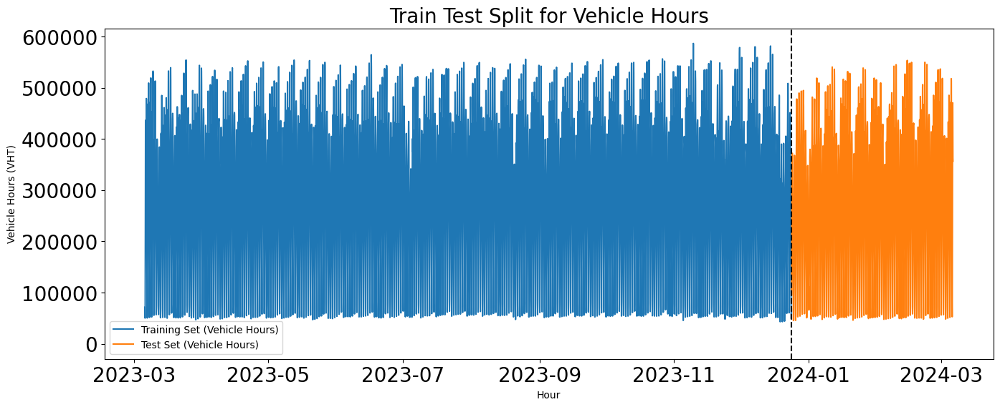

In [32]:
# Vehicle Hours
plt.figure(figsize=(16,6))
plt.plot(DOM_train['Hour'], DOM_train['VHT (Veh-Hours)'],
         label='Training Set (Vehicle Hours)')
plt.plot(DOM_test['Hour'], DOM_test['VHT (Veh-Hours)'],
         label='Testing Set (Vehicle Hours)')
plt.axvline(x = df.Hour[split_pos], color='black', ls='--')
plt.legend(['Training Set (Vehicle Hours)', 'Test Set (Vehicle Hours)'])
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.xlabel("Hour")
plt.ylabel("Vehicle Hours (VHT)")
plt.title("Train Test Split for Vehicle Hours", fontsize = 20)
plt.show()

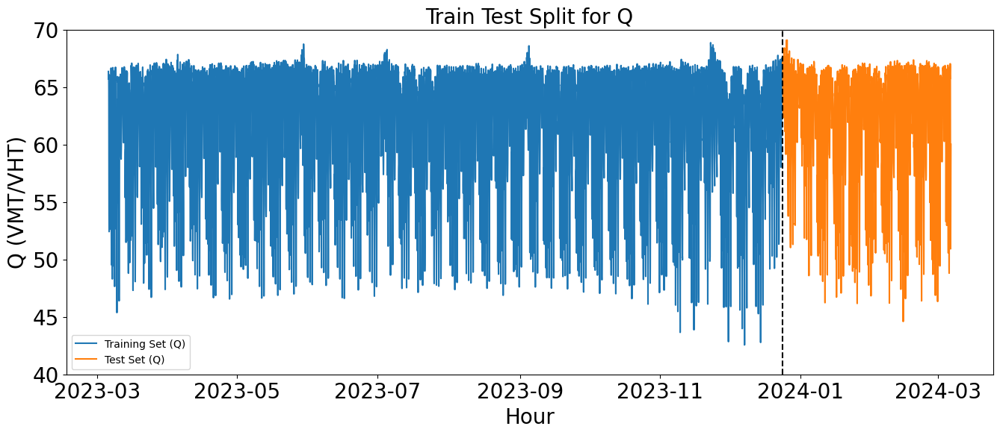

In [33]:
# Q is the sum of VMT divided by the sum of VHT or space mean
# speeds/harmonic mean of speeds on the freeway.
plt.figure(figsize=(16,6))
plt.plot(DOM_train['Hour'], DOM_train['Q (VMT/VHT)'],
         label='Training Set (Vehicle Hours)')
plt.plot(DOM_test['Hour'], DOM_test['Q (VMT/VHT)'],
         label='Testing Set (Vehicle Hours)')
plt.axvline(x = df.Hour[split_pos], color='black', ls='--')
plt.legend(['Training Set (Q)', 'Test Set (Q)'])
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.xlabel("Hour", fontsize = 20)
plt.ylabel("Q (VMT/VHT)", fontsize = 20)
plt.ylim([40, 70])
plt.title("Train Test Split for Q", fontsize = 20)
plt.show()

In [34]:
# We index the Datetime column after transformation
df.set_index('Hour', inplace=True)
df.head()

,VMT (Veh-Miles),VHT (Veh-Hours),Q (VMT/VHT),# Lane Points,% Observed,vmt_norm,vht_norm,Q_norm
Hour,,,,,,,,
2023-03-06 00:00:00,4730945.9,71292.8,66.359379,430583,55.0,0.079266,0.051819,0.896983
2023-03-06 01:00:00,3539705.6,53661.0,65.964212,430728,55.0,0.029970,0.019358,0.882088
2023-03-06 02:00:00,3303421.8,50292.4,65.684314,430476,54.9,0.020192,0.013156,0.871538
2023-03-06 03:00:00,4293866.2,65046.6,66.012154,430728,54.9,0.061179,0.040319,0.883895
2023-03-06 04:00:00,7919316.8,119801.6,66.103598,430728,54.8,0.211209,0.141126,0.887342


# Prepare Data for Training the Models.

With the following function block, let's set our data set as training and test data set in a model appropriate way.



In [35]:
def load_data(data, seq_len):
    X_train = []
    y_train = []

    for i in range(seq_len, len(data)):
        X_train.append(data.iloc[i-seq_len : i, 0])
        y_train.append(data.iloc[i, 0])

    # last days are going to be used in test
    X_test = X_train[split_pos:]
    y_test = y_train[split_pos:]

    # first  days are going to be used in training
    X_train = X_train[:split_pos]
    y_train = y_train[:split_pos]

    # convert to numpy array
    X_train = np.array(X_train)
    y_train = np.array(y_train)
    X_test = np.array(X_test)
    y_test = np.array(y_test)

    # reshape data to input into RNN, LSTM, and GRU models
    X_train = np.reshape(X_train, (split_pos, seq_len, 1))
    X_test = np.reshape(X_test, (X_test.shape[0], seq_len, 1))

    return [X_train, y_train, X_test, y_test]



*   The seq_len parameter determines how far back the model will look at historical data, helping the model to capture time dependencies in a memory-aware way.
*   We should note that if "seq_len" is too large, the model can become complex and prone to overlearning.
*   We can specify separate seq_len values for RNN and LSTM

In [36]:
df_vht = df_norm.copy()
df_vht = df_vht.drop(columns = ['VMT (Veh-Miles)', 'VHT (Veh-Hours)',
                                'Q (VMT/VHT)', '# Lane Points', '% Observed',
                                'vmt_norm', 'Q_norm'])
#df_vht = df.copy()
#df_vht = df_vht.drop(columns = ['VMT (Veh-Miles)', '# Lane Points',
#                                '% Observed', 'vmt_norm', 'vht_norm'])

df_vmt = df_norm.copy()
df_vmt = df_vmt.drop(columns = ['VHT (Veh-Hours)', 'VMT (Veh-Miles)',
                                'Q (VMT/VHT)', '# Lane Points', '% Observed',
                                'vht_norm', 'Q_norm'])
#df_vmt = df.copy()
#df_vmt = df_vmt.drop(columns = ['VHT (Veh-Hours)','# Lane Points',
#                                '% Observed', 'vmt_norm', 'vht_norm'])

df_Q = df_norm.copy()
df_Q = df_Q.drop(columns = ['VHT (Veh-Hours)', 'VMT (Veh-Miles)',
                            'Q (VMT/VHT)', '# Lane Points', '% Observed',
                            'vmt_norm', 'vht_norm'])

#df_Q = df_norm.copy()
#df_Q = df_Q.drop(columns = ['VHT (Veh-Hours)', 'VMT (Veh-Miles)',
#                            '# Lane Points', '% Observed', 'vmt_norm',
#                            'vht_norm', 'Q_norm'])

In [37]:
df_norm2 = df_norm.drop(columns = ['VHT (Veh-Hours)', 'VMT (Veh-Miles)',
                                   '# Lane Points', '% Observed',])
df_norm2

,Q (VMT/VHT),vmt_norm,vht_norm,Q_norm
Hour,,,,
2023-03-06 00:00:00,66.359379,0.079266,0.051819,0.896983
2023-03-06 01:00:00,65.964212,0.029970,0.019358,0.882088
2023-03-06 02:00:00,65.684314,0.020192,0.013156,0.871538
2023-03-06 03:00:00,66.012154,0.061179,0.040319,0.883895
2023-03-06 04:00:00,66.103598,0.211209,0.141126,0.887342
...,...,...,...,...
2024-03-06 07:00:00,53.107203,0.901642,0.773489,0.397474
2024-03-06 08:00:00,50.924729,0.874690,0.786497,0.315210
2024-03-06 09:00:00,54.672581,0.799220,0.665724,0.456477


In [38]:
df_vht

,vht_norm
Hour,
2023-03-06 00:00:00,0.051819
2023-03-06 01:00:00,0.019358
2023-03-06 02:00:00,0.013156
2023-03-06 03:00:00,0.040319
2023-03-06 04:00:00,0.141126
...,...
2024-03-06 07:00:00,0.773489
2024-03-06 08:00:00,0.786497
2024-03-06 09:00:00,0.665724


In [39]:
df_vmt

,vmt_norm
Hour,
2023-03-06 00:00:00,0.079266
2023-03-06 01:00:00,0.029970
2023-03-06 02:00:00,0.020192
2023-03-06 03:00:00,0.061179
2023-03-06 04:00:00,0.211209
...,...
2024-03-06 07:00:00,0.901642
2024-03-06 08:00:00,0.874690
2024-03-06 09:00:00,0.799220


In [40]:
df_Q

,Q_norm
Hour,
2023-03-06 00:00:00,0.896983
2023-03-06 01:00:00,0.882088
2023-03-06 02:00:00,0.871538
2023-03-06 03:00:00,0.883895
2023-03-06 04:00:00,0.887342
...,...
2024-03-06 07:00:00,0.397474
2024-03-06 08:00:00,0.315210
2024-03-06 09:00:00,0.456477


In [41]:
a = int(input("Enter a number (Odd Number for Vehicle Hours,\
Even Number for Vehicle Miles\Odd Number divisible by 3 for Q (Space Mean/\
Harmonic Speed)): "))

feature = ""
selected_df = ""
feature_norm = ""
feature_field = ""

if a % 2 == 0:
    feature = 'Vehicle Miles'
    selected_df = df_vmt
    feature_norm = 'vmt_norm'
    feature_field = 'VMT (Veh-Miles)'

elif a % 3 == 0:
    feature = 'Space Mean/Harmonic Speed'
    selected_df = df_Q
    feature_norm = 'Q_norm'
    feature_field = 'Q (VMT/VHT)'

else:
    feature = 'Vehicle Hours'
    selected_df = df_vht
    feature_norm = 'vht_norm'
    feature_field = 'VHT (Veh-Hours)'

print("You've chosen: {0}/{1}/{2}".format(feature, feature_norm, feature_field))

Enter a number (Odd Number for Vehicle Hours,Even Number for Vehicle Miles\Odd Number divisible by 3 for Q (Space Mean/Harmonic Speed)): 3
You've chosen: Space Mean/Harmonic Speed/Q_norm/Q (VMT/VHT)


In [42]:
seq_len = 20
#seq_len = 6*24*30

# Let's create train, test data
#X_train, y_train, X_test, y_test = load_data(df_vht, seq_len)
#X_train, y_train, X_test, y_test = load_data(df_vmt, seq_len)
X_train, y_train, X_test, y_test = load_data(selected_df, seq_len)
#X_train, y_train, X_test, y_test = load_data(df_norm2, seq_len)


print('X_train.shape = ',X_train.shape)
print('y_train.shape = ', y_train.shape)
print('X_test.shape = ', X_test.shape)
print('y_test.shape = ',y_test.shape)

X_train.shape =  (7036, 20, 1)
y_train.shape =  (7036,)
X_test.shape =  (1739, 20, 1)
y_test.shape =  (1739,)


In [43]:
X_train

array([[[0.89698319],
        [0.88208833],
        [0.87153823],
        ...,
        [0.3795464 ],
        [0.53618808],
        [0.75291884]],

       [[0.88208833],
        [0.87153823],
        [0.88389539],
        ...,
        [0.53618808],
        [0.75291884],
        [0.83297667]],

       [[0.87153823],
        [0.88389539],
        [0.88734215],
        ...,
        [0.75291884],
        [0.83297667],
        [0.88284357]],

       ...,

       [[0.90815155],
        [0.89846576],
        [0.90487378],
        ...,
        [0.84631315],
        [0.86101689],
        [0.95386939]],

       [[0.89846576],
        [0.90487378],
        [0.91890749],
        ...,
        [0.86101689],
        [0.95386939],
        [0.96329094]],

       [[0.90487378],
        [0.91890749],
        [0.9199068 ],
        ...,
        [0.95386939],
        [0.96329094],
        [0.96826151]]])

In [44]:
X_test

array([[[0.91890749],
        [0.9199068 ],
        [0.92844702],
        ...,
        [0.96329094],
        [0.96826151],
        [0.96781635]],

       [[0.9199068 ],
        [0.92844702],
        [0.9259517 ],
        ...,
        [0.96826151],
        [0.96781635],
        [0.9741406 ]],

       [[0.92844702],
        [0.9259517 ],
        [0.89934155],
        ...,
        [0.96781635],
        [0.9741406 ],
        [0.95280242]],

       ...,

       [[0.64968194],
        [0.55970156],
        [0.37723423],
        ...,
        [0.61105245],
        [0.39747358],
        [0.31521033]],

       [[0.55970156],
        [0.37723423],
        [0.2574696 ],
        ...,
        [0.39747358],
        [0.31521033],
        [0.4564768 ]],

       [[0.37723423],
        [0.2574696 ],
        [0.23532842],
        ...,
        [0.31521033],
        [0.4564768 ],
        [0.60949634]]])

In [45]:
y_train

array([0.83297667, 0.88284357, 0.88000964, ..., 0.96329094, 0.96826151,
       0.96781635])

In [46]:
y_test

array([0.9741406 , 0.95280242, 0.91950719, ..., 0.4564768 , 0.60949634,
       0.65818159])

# ARIMA Modeling.

In [47]:
df_copy = df_norm.copy()
df_copy

,VMT (Veh-Miles),VHT (Veh-Hours),Q (VMT/VHT),# Lane Points,% Observed,vmt_norm,vht_norm,Q_norm
Hour,,,,,,,,
2023-03-06 00:00:00,4730945.9,71292.8,66.359379,430583,55.0,0.079266,0.051819,0.896983
2023-03-06 01:00:00,3539705.6,53661.0,65.964212,430728,55.0,0.029970,0.019358,0.882088
2023-03-06 02:00:00,3303421.8,50292.4,65.684314,430476,54.9,0.020192,0.013156,0.871538
2023-03-06 03:00:00,4293866.2,65046.6,66.012154,430728,54.9,0.061179,0.040319,0.883895
2023-03-06 04:00:00,7919316.8,119801.6,66.103598,430728,54.8,0.211209,0.141126,0.887342
...,...,...,...,...,...,...,...,...
2024-03-06 07:00:00,24603494.5,463279.8,53.107203,443975,54.1,0.901642,0.773489,0.397474
2024-03-06 08:00:00,23952196.6,470345.1,50.924729,443974,54.2,0.874690,0.786497,0.315210
2024-03-06 09:00:00,22128475.5,404745.4,54.672581,444146,53.0,0.799220,0.665724,0.456477


# Decomposition (Additive and Multiplicative).

## Additive Decomposition

In [54]:
def additive_decomp(df_feature, feature):
  additive_dec_df = seasonal_decompose(df_feature, model='additive', period=30)
  plt.figure(figsize=(12,8))
  additive_dec_df.plot()
  plt.suptitle('Additive Decomposition {0}'.format(feature), fontsize=12)
  plt.tight_layout()
  plt.show()

<Figure size 1440x960 with 0 Axes>

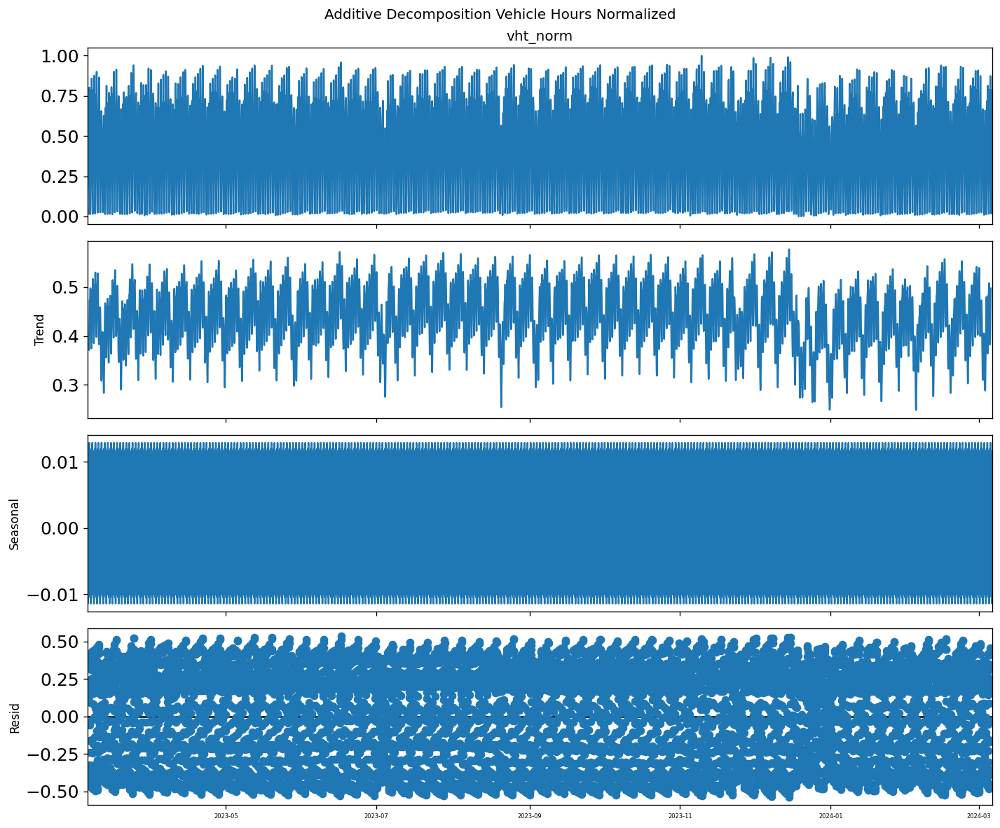

<Figure size 1440x960 with 0 Axes>

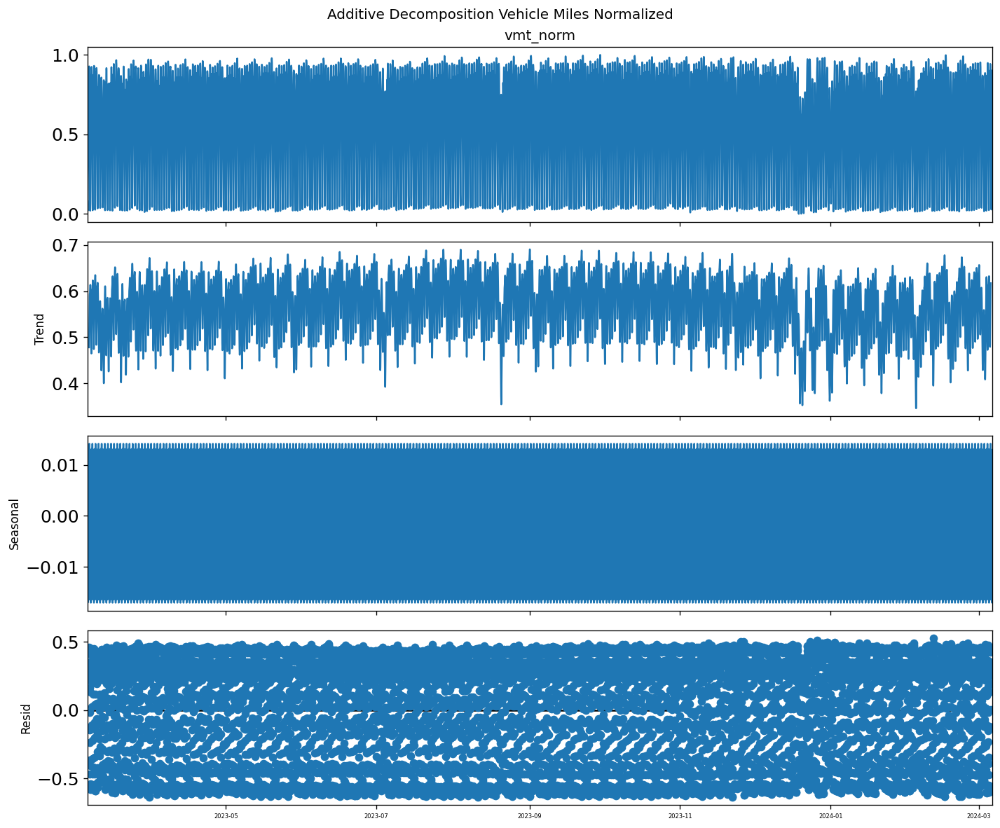

<Figure size 1440x960 with 0 Axes>

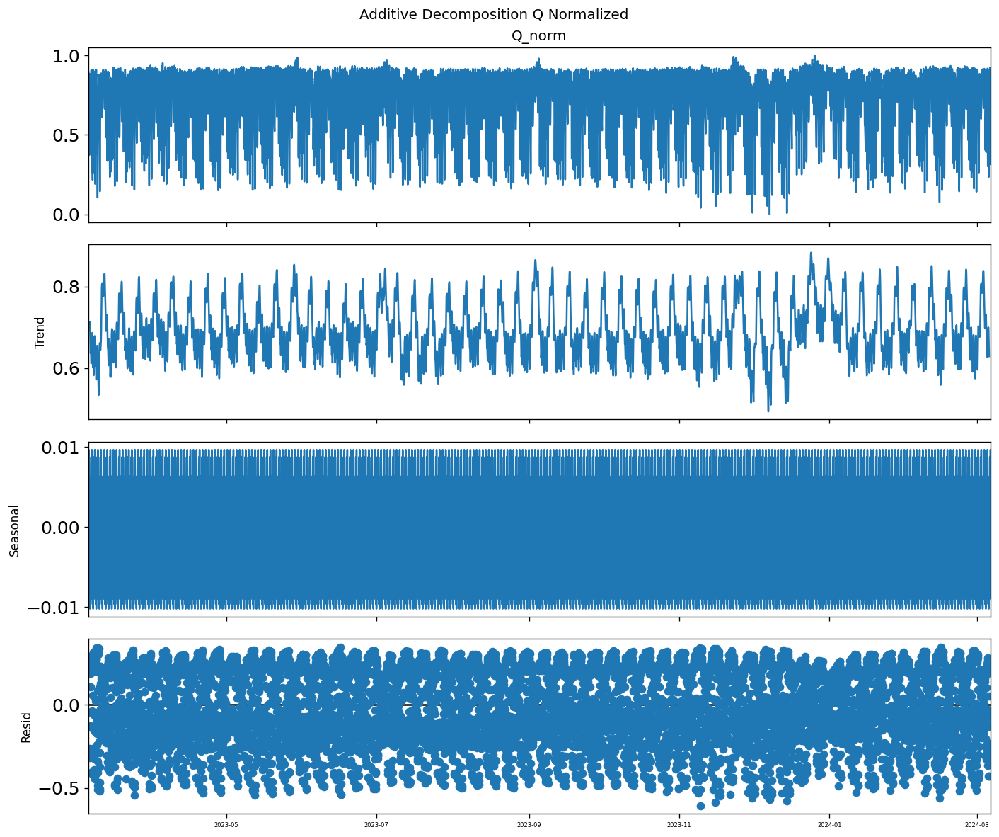

In [55]:
additive_decomp(df_copy['vht_norm'], 'Vehicle Hours Normalized')
additive_decomp(df_copy['vmt_norm'], 'Vehicle Miles Normalized')
additive_decomp(df_copy['Q_norm'], 'Q Normalized')

## Multiplicative Decomposition

In [56]:
def mult_decomp(df_feature, feature):
    mult_dec_df = seasonal_decompose(df_feature, model='multiplicative',
                                      period=30)
    plt.figure(figsize=(12,8))
    mult_dec_df.plot()
    plt.suptitle('Multiplicative Decomposition {0}'.format(feature),
                 fontsize=12)
    plt.tight_layout()
    plt.show()

<Figure size 1440x960 with 0 Axes>

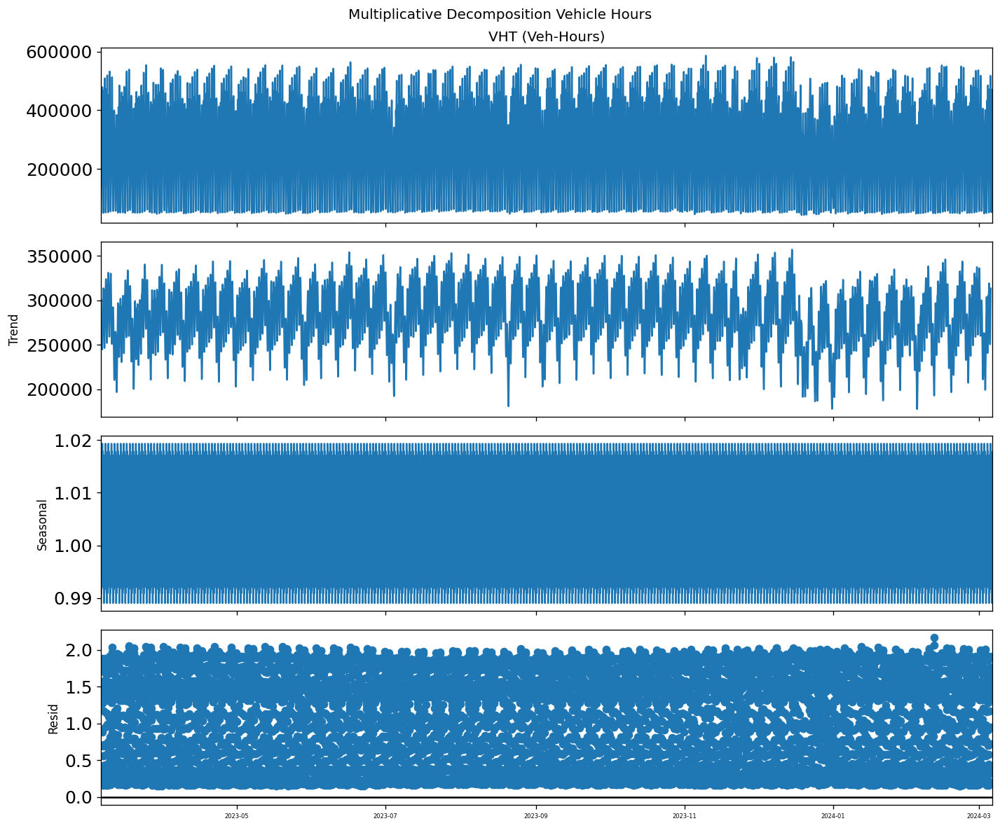

<Figure size 1440x960 with 0 Axes>

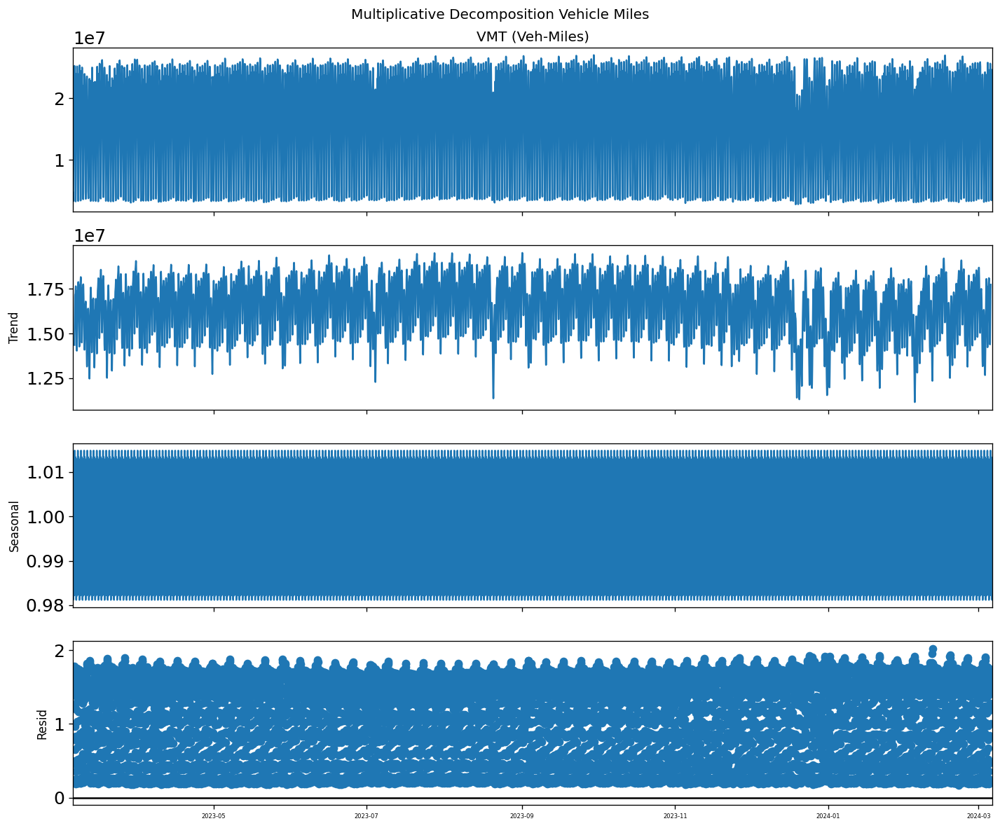

<Figure size 1440x960 with 0 Axes>

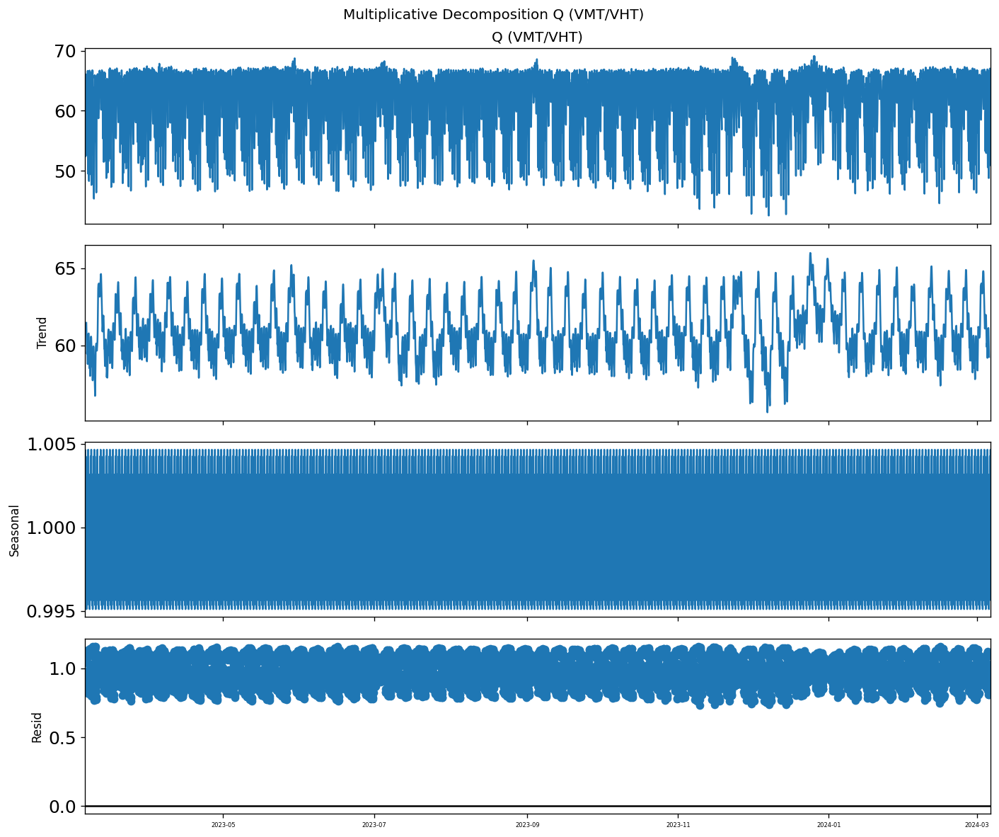

In [57]:
mult_decomp(df_copy['VHT (Veh-Hours)'], 'Vehicle Hours')
mult_decomp(df_copy['VMT (Veh-Miles)'], 'Vehicle Miles')
mult_decomp(df_copy['Q (VMT/VHT)'], 'Q (VMT/VHT)')

# Dickey Fuller Test.

H0: time series data is non-stationary

H1: time series data is stationary

p-value < 0.05 -> reject null hypothesis (H0)

In [58]:
#result_adfuller = adfuller(df_copy['VHT (Veh-Hours)'], autolag='AIC')
#result_adfuller = adfuller(df_copy['VMT (Veh-Miles)'], autolag='AIC')
#result_adfuller = adfuller(df_copy['vht_norm'], autolag='AIC')
result_adfuller = adfuller(df_copy[feature_norm], autolag='AIC')
print(f'ADF Statistic: {result_adfuller[0]}')
print(f'p-value: {result_adfuller[1]}')

ADF Statistic: -12.093600956521527
p-value: 2.0951243192255728e-22


# KPSS Test

H0: time series data is stationary

H1: time series data is non-stationary

p-value < 0.05 -> reject null hypothesis (H0)

In [59]:
#result_kpss = kpss(df_copy['VMT (Veh-Miles)'])
#result_kpss = kpss(df_copy['VHT (Veh-Hours)'])
result_kpss = kpss(df_copy[feature_norm])
#result_kpss = kpss(df_copy['vht_norm'])
print(f'KPSS Statistic: {result_kpss[0]}')
print(f'p-value: {result_kpss[1]}')

KPSS Statistic: 0.07350513960192842
p-value: 0.1


<ipython-input-59-463868b1b559>:3: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  result_kpss = kpss(df_copy[feature_norm])


Based on the Results of the Dickey-Fuller and KPSS tests, the dataset is stationary.

# Rolling Test

In [60]:
def rolling_test(selected_df, feature):
  rolling_mean = selected_df.rolling(12).mean()
  rolling_std =  selected_df.rolling(12).std()
  plt.figure(figsize=(16,8))
  plt.plot(selected_df, label=feature)
  plt.plot(rolling_mean, color="red",
          label="{0} Rolling Mean".format(feature))
  plt.plot(rolling_std, color="green",
          label="{0} Standard Deviation".format(feature))
  plt.locator_params(axis='x', nbins=10)
  plt.locator_params(axis='y', nbins=10)
  plt.rc('xtick', labelsize=20)
  plt.rc('ytick', labelsize=20)
  plt.xlabel('Time', fontsize = 20)
  plt.title("{0} Time Series, Rolling Mean, Standard Deviation".format(feature),
            fontsize = 20)
  plt.legend(loc='best')
  plt.show()

In [61]:
# Yearly
rolling_test(df_copy['vmt_norm'],'Vehicle Miles Normalized')
rolling_test(df_copy['vht_norm'],'Vehicle Hours Normalized')
rolling_test(df_copy['Q_norm'],'Q Normalized')
# Monthly
rolling_test(monthly_df['vmt_norm'],'Vehicle Hours Normalized Monthly')
rolling_test(monthly_df['vht_norm'],'Vehicle Hours Normalized Monthly')
rolling_test(monthly_df['Q_norm'],'Q Normalized Monthly')
# Weekly
rolling_test(weekly_df['vmt_norm'],'Vehicle Hours Normalized Weekly')
rolling_test(weekly_df['vht_norm'],'Vehicle Hours Normalized Weekly')
rolling_test(weekly_df['Q_norm'],'Q Normalized Weekly')

Output hidden; open in https://colab.research.google.com to view.

# ARIMA Model Parameter Setup

## ARIMA d Parameter

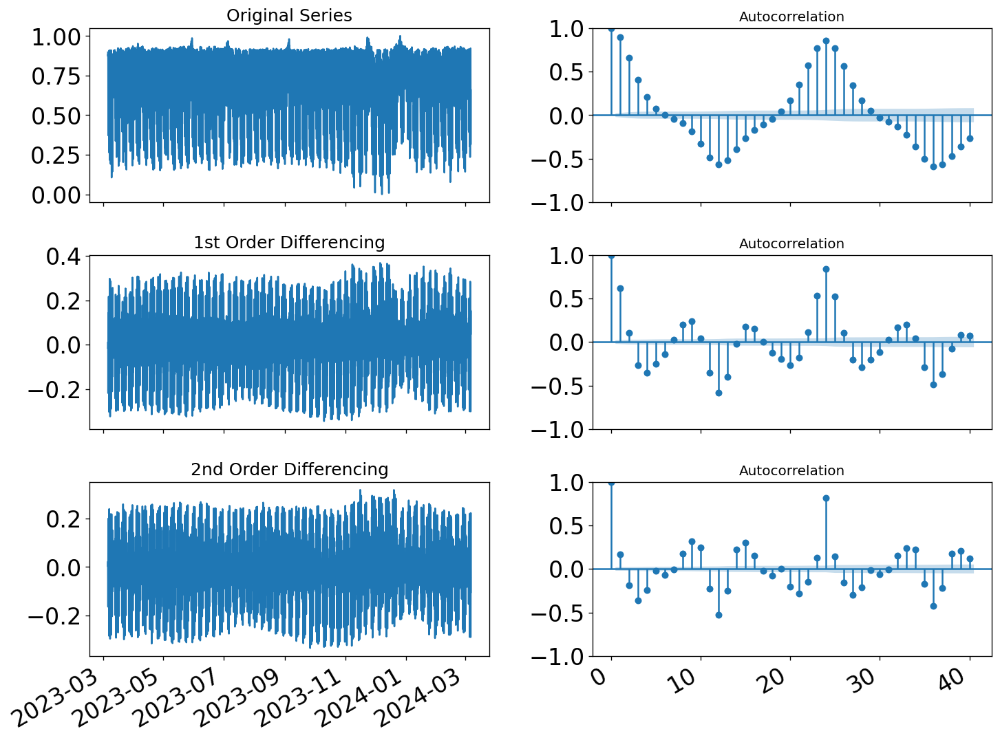

In [62]:
plt.rcParams.update({'figure.figsize':(12,10), 'figure.dpi':120})

# Original Series
fig, axes = plt.subplots(3, 2, sharex=False)
#axes[0, 0].plot(df_copy['VMT (Veh-Miles)'])
#axes[0, 0].plot(df_copy['VHT (Veh-Hours)'])
#axes[0, 0].plot(df_copy['vmt_norm'])
#axes[0, 0].plot(df_copy['vht_norm'])
axes[0, 0].plot(df_copy['Q_norm'])

axes[0, 0].set_title('Original Series', fontsize = 15)
#plot_acf(df_copy['VMT (Veh-Miles)'].values, ax=axes[0, 1])
#plot_acf(df_copy['VHT (Veh-Hours)'].values, ax=axes[0, 1])
#plot_acf(df_copy['vmt_norm'].values, ax=axes[0, 1])
#plot_acf(df_copy['vht_norm'].values, ax=axes[0, 1])
plot_acf(df_copy['Q_norm'].values, ax=axes[0, 1])
plt.rc('xtick', labelsize=15)
plt.rc('ytick', labelsize=15)
plt.locator_params(axis='x', nbins=5)
#plt.locator_params(axis='y', nbins=5)

# 1st Differencing
#axes[1, 0].plot(df_copy['VMT (Veh-Miles)'].diff())
#axes[1, 0].plot(df_copy['VHT (Veh-Hours)'].diff())
#axes[1, 0].plot(df_copy['vmt_norm'].diff())
#axes[1, 0].plot(df_copy['vht_norm'].diff())
axes[1, 0].plot(df_copy['Q_norm'].diff())
axes[1, 0].set_title('1st Order Differencing', fontsize = 15)
#plot_acf(df_copy['VMT (Veh-Miles)'].diff().dropna(), ax=axes[1, 1])
#plot_acf(df_copy['VHT (Veh-Hours)'].diff().dropna(), ax=axes[1, 1])
#plot_acf(df_copy['vmt_norm'].diff().dropna(), ax=axes[1, 1])
#plot_acf(df_copy['vht_norm'].diff().dropna(), ax=axes[1, 1])
plot_acf(df_copy['Q_norm'].diff().dropna(), ax=axes[1, 1])
plt.rc('xtick', labelsize=15)
plt.rc('ytick', labelsize=15)
plt.locator_params(axis='x', nbins=5)
#plt.locator_params(axis='y', nbins=5)

# 2nd Differencing
#axes[2, 0].plot(df_copy['VMT (Veh-Miles)'].diff().diff())
#axes[2, 0].plot(df_copy['VHT (Veh-Hours)'].diff().diff())
#axes[2, 0].plot(df_copy['vmt_norm'].diff().diff())
#axes[2, 0].plot(df_copy['vht_norm'].diff().diff())
axes[2, 0].plot(df_copy['Q_norm'].diff().diff())
axes[2, 0].set_title('2nd Order Differencing', fontsize = 15)
#plot_acf(df_copy['VMT (Veh-Miles)'].diff().diff().dropna(), ax=axes[2, 1])
#plot_acf(df_copy['VHT (Veh-Hours)'].diff().diff().dropna(), ax=axes[2, 1])
#plot_acf(df_copy['vmt_norm'].diff().diff().dropna(), ax=axes[2, 1])
#plot_acf(df_copy['vht_norm'].diff().diff().dropna(), ax=axes[2, 1])
plot_acf(df_copy['Q_norm'].diff().diff().dropna(), ax=axes[2, 1])
plt.rc('xtick', labelsize=15)
plt.rc('ytick', labelsize=15)
plt.locator_params(axis='x', nbins=5)
#plt.locator_params(axis='y', nbins=5)

plt.tight_layout()
fig.autofmt_xdate()
plt.show()

In [63]:
d = 0

## AR Term (p)

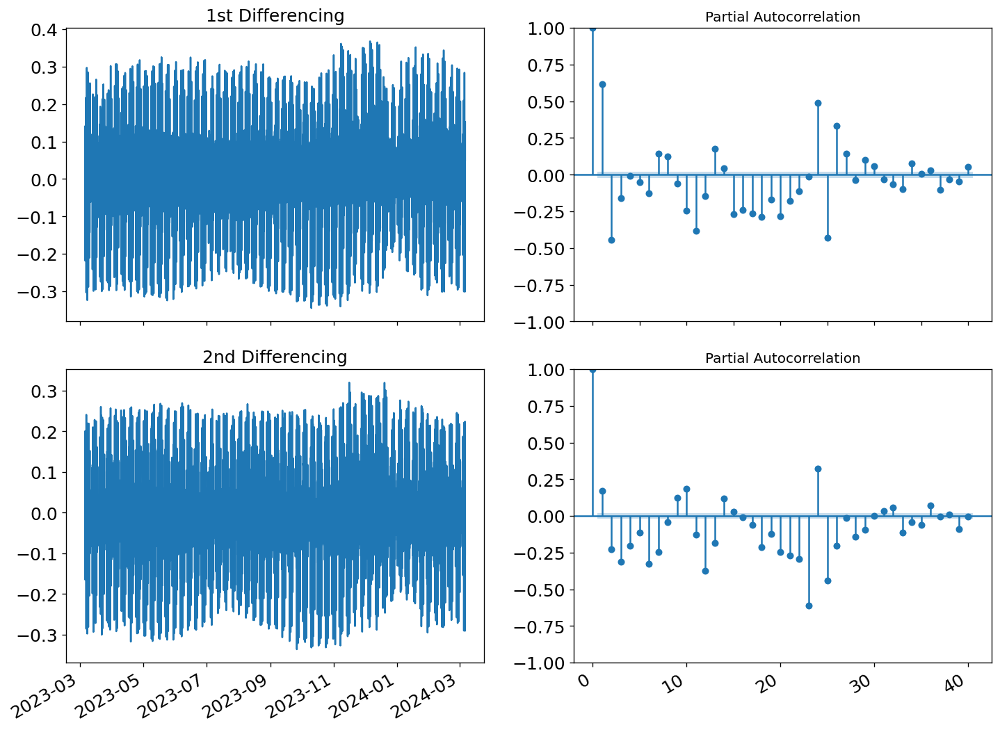

In [64]:
plt.rcParams.update({'figure.figsize':(12, 10), 'figure.dpi':120})

fig, axes = plt.subplots(2, 2, sharex=False)

# PACF plot of 1st differenced series
#axes[0,0].plot(df_copy['VMT (Veh-Miles)'].diff())
#axes[0,0].plot(df_copy['VHT (Veh-Hours)'].diff())
#axes[0,0].plot(df_copy['vmt_norm'].diff())
#axes[0,0].plot(df_copy['vht_norm'].diff())
axes[0,0].plot(df_copy['Q_norm'].diff())

axes[0,0].set_title('1st Differencing', fontsize = 15)
axes[0,1].set(ylim=(0,5))
#plot_pacf(df_copy['VMT (Veh-Miles)'].diff().dropna(), ax=axes[1,1])
#plot_pacf(df_copy['VHT (Veh-Hours)'].diff().dropna(), ax=axes[0,1])
#plot_pacf(df_copy['vmt_norm'].diff().dropna(), ax=axes[0,1])
#plot_pacf(df_copy['vht_norm'].diff().dropna(), ax=axes[0,1])
plot_pacf(df_copy['Q_norm'].diff().dropna(), ax=axes[0,1])
plt.rc('xtick', labelsize=10)
#plt.rc('ytick', labelsize=10)
plt.locator_params(axis='x', nbins=5)
#plt.locator_params(axis='y', nbins=5)

# PACF plot of 2nd differenced series
#axes[1,0].plot(df_copy['VMT (Veh-Miles)'].diff().diff())
#axes[1,0].plot(df_copy['VHT (Veh-Hours)'].diff().diff())
#axes[1,0].plot(df_copy['vmt_norm'].diff().diff())
#axes[1,0].plot(df_copy['vht_norm'].diff().diff())
axes[1,0].plot(df_copy['Q_norm'].diff().diff())
axes[1,0].set_title('2nd Differencing', fontsize = 15)
axes[1,1].set(ylim=(0,5))
#plot_pacf(df_copy['VMT (Veh-Miles)'].diff().diff().dropna(),
#          ax=axes[1,1])
#plot_pacf(df_copy['VHT (Veh-Hours)'].diff().diff().dropna(),
#          ax=axes[1,1])
#plot_pacf(df_copy['vmt_norm'].diff().diff().dropna(),
#          ax=axes[1,1])
#plot_pacf(df_copy['vht_norm'].diff().diff().dropna(),
#          ax=axes[1,1])
plot_pacf(df_copy['Q_norm'].diff().diff().dropna(),
          ax=axes[1,1])
plt.rc('xtick', labelsize=10)
#plt.rc('ytick', labelsize=10)
plt.locator_params(axis='x', nbins=5)
#plt.locator_params(axis='y', nbins=5)
plt.tight_layout()
fig.autofmt_xdate()
plt.show()

In [65]:
p = 0

## MA Term (q)

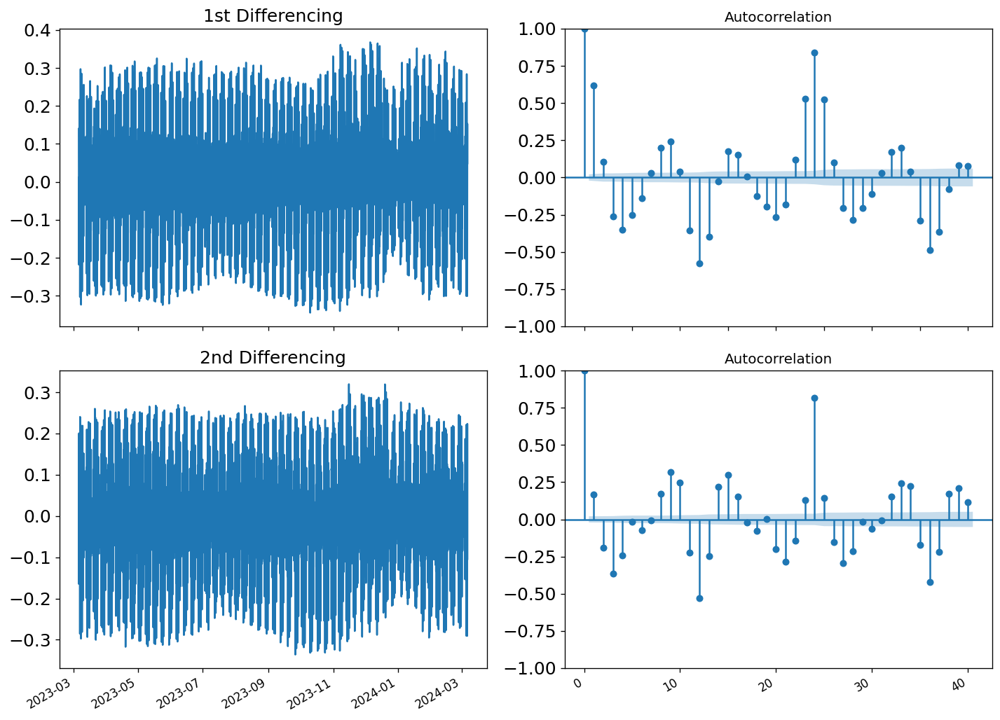

In [66]:
plt.rcParams.update({'figure.figsize':(12,10), 'figure.dpi':120})

fig, axes = plt.subplots(2, 2, sharex=False)

# ACF plot of 1st differenced series
#axes[0,0].plot(df_copy['VMT (Veh-Miles)'].diff())
#axes[0,0].plot(df_copy['VHT (Veh-Hours)'].diff())
#axes[0,0].plot(df_copy['vmt_norm'].diff())
#axes[0,0].plot(df_copy['vht_norm'].diff())
axes[0,0].plot(df_copy['Q_norm'].diff())


axes[0,0].set_title('1st Differencing', fontsize = 15)
axes[0,1].set(ylim=(0,5))
#plot_acf(df_copy['VMT (Veh-Miles)'].diff().dropna(), ax=axes[0,1])
#plot_acf(df_copy['VHT (Veh-Hours)'].diff().dropna(), ax=axes[0,1])

#plot_acf(df_copy['vmt_norm'].diff().dropna(), ax=axes[0,1])
#plot_acf(df_copy['vht_norm'].diff().dropna(), ax=axes[0,1])
plot_acf(df_copy['Q_norm'].diff().dropna(), ax=axes[0,1])
plt.rc('xtick', labelsize=10)
#plt.rc('ytick', labelsize=10)
plt.locator_params(axis='x', nbins=5)
#plt.locator_params(axis='y', nbins=5)

# ACF plot of 2nd differenced series
#axes[1,0].plot(df_copy['VMT (Veh-Miles)'].diff().diff())
#axes[1,0].plot(df_copy['VHT (Veh-Hours)'].diff().diff())
#axes[1,0].plot(df_copy['vmt_norm'].diff().diff())
#axes[1,0].plot(df_copy['vht_norm'].diff().diff())
axes[1,0].plot(df_copy['Q_norm'].diff().diff())
axes[1,0].set_title('2nd Differencing', fontsize = 15)
axes[1,1].set(ylim=(0,5))
#plot_acf(df_copy['VMT (Veh-Miles)'].diff().diff().dropna(), ax=axes[1,1])
#plot_acf(df_copy['VHT (Veh-Hours)'].diff().diff().dropna(), ax=axes[1,1])
#plot_acf(df_copy['vmt_norm'].diff().diff().dropna(), ax=axes[1,1])
#plot_acf(df_copy['vht_norm'].diff().diff().dropna(), ax=axes[1,1])
plot_acf(df_copy['Q_norm'].diff().diff().dropna(), ax=axes[1,1])
plt.rc('xtick', labelsize=5)
#plt.rc('ytick', labelsize=10)
plt.locator_params(axis='x', nbins=5)
#plt.locator_params(axis='y', nbins=5)
plt.tight_layout()
fig.autofmt_xdate()
plt.show()

In [67]:
q = 0

# ARIMA Model Version 1.

Portions of the remaining code inspired from https://machinelearningmastery.com/arima-for-time-series-forecasting-with-python/.

## Essential Variables.

In [ ]:
#Feature = 'VHT (Veh-Hours)'
#Feature = 'VMT (Veh-Miles)'
#Feature = 'vmt_norm'
#series = df_copy[Feature]
series = selected_df[feature_norm]
#series = selected_df[feature]
#series.index = df_copy[feature_norm].index
series.index = selected_df[feature_norm].index
# split into train and test sets
X = series.values
size = int(len(X) * 0.8)
train_v1, test_v1 = X[0:size], X[size:len(X)]
history = [x for x in train_v1]
predictions = list()

## Creating and Training Model.

In [ ]:
# Re-train ARIMA
#model = ARIMA(selected_df[feature_norm], order=(p, d, q))
model = ARIMA(selected_df[feature_norm], order=(0, 0, 0))
Ar = model.fit()

# Forecast
fc = Ar.get_forecast(test_v1.shape[0]).summary_frame()
# fc_conf_int = fc.conf_int(alpha=0.05)
fc = pd.DataFrame(fc).rename({'mean':'#{0}'.format(feature_norm)},axis=1)
fc

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


Q_norm,#Q_norm,mean_se,mean_ci_lower,mean_ci_upper
8795,0.694713,0.209828,0.283458,1.105968
8796,0.694713,0.209828,0.283458,1.105968
8797,0.694713,0.209828,0.283458,1.105968
8798,0.694713,0.209828,0.283458,1.105968
8799,0.694713,0.209828,0.283458,1.105968
...,...,...,...,...
10549,0.694713,0.209828,0.283458,1.105968
10550,0.694713,0.209828,0.283458,1.105968
10551,0.694713,0.209828,0.283458,1.105968
10552,0.694713,0.209828,0.283458,1.105968


In [ ]:
# walk-forward validation
for t in range(len(test_v1)):
    #if (t % 100) == 0:
    print("t: ", t)
    model = ARIMA(history, order=(0,0,0))
    warnings.simplefilter('ignore', ConvergenceWarning)
    model_fit = model.fit()
    output = model_fit.forecast()
    yhat = output[0]
    predictions.append(yhat)
    obs = test_v1[t]
    history.append(obs)
    #print('predicted=%f, expected=%f' % (yhat, obs))

t:  0
t:  1
t:  2
t:  3
t:  4
t:  5
t:  6
t:  7
t:  8
t:  9
t:  10
t:  11
t:  12
t:  13
t:  14
t:  15
t:  16
t:  17
t:  18
t:  19
t:  20
t:  21
t:  22
t:  23
t:  24
t:  25
t:  26
t:  27
t:  28
t:  29
t:  30
t:  31
t:  32
t:  33
t:  34
t:  35
t:  36
t:  37
t:  38
t:  39
t:  40
t:  41
t:  42
t:  43
t:  44
t:  45
t:  46
t:  47
t:  48
t:  49
t:  50
t:  51
t:  52
t:  53
t:  54
t:  55
t:  56
t:  57
t:  58
t:  59
t:  60
t:  61
t:  62
t:  63
t:  64
t:  65
t:  66
t:  67
t:  68
t:  69
t:  70
t:  71
t:  72
t:  73
t:  74
t:  75
t:  76
t:  77
t:  78
t:  79
t:  80
t:  81
t:  82
t:  83
t:  84
t:  85
t:  86
t:  87
t:  88
t:  89
t:  90
t:  91
t:  92
t:  93
t:  94
t:  95
t:  96
t:  97
t:  98
t:  99
t:  100
t:  101
t:  102
t:  103
t:  104
t:  105
t:  106
t:  107
t:  108
t:  109
t:  110
t:  111
t:  112
t:  113
t:  114
t:  115
t:  116
t:  117
t:  118
t:  119
t:  120
t:  121
t:  122
t:  123
t:  124
t:  125
t:  126
t:  127
t:  128
t:  129
t:  130
t:  131
t:  132
t:  133
t:  134
t:  135
t:  136
t:  137
t:  13

## Plot Forecasts Against Actual Outcomes

## Evaluation.

In [ ]:
arima_mae_v1 = mean_absolute_error(test_v1,predictions)
print("MAE of ARIMA Statistical model = ", arima_mae_v1)
arima_rmse_v1 =  mean_squared_error(test_v1, predictions) ** 0.5
print("RMSE of ARIMA Statistical model = ",arima_rmse_v1)
#arima_r2_v1 = r2_score(test_v1, predictions)
#print("R^2 Score of ARIMA Statistical model = ",arima_r2_v1)
arima_mape_v1 = 100*mean_absolute_percentage_error(test_v1, predictions)
print("MAPE Score of ARIMA Statistical model = {0} %".format(arima_mape_v1))

MAE of ARIMA Statistical model =  0.17159382210190646
RMSE of ARIMA Statistical model =  0.20132413830291787
MAPE Score of ARIMA Statistical model = 33.5555343606216 %


## Residual Plots.

In [ ]:
selected_df = selected_df.reset_index()
selected_df

,Hour,Q_norm
0,2023-03-06 00:00:00,0.896983
1,2023-03-06 01:00:00,0.882088
2,2023-03-06 02:00:00,0.871538
3,2023-03-06 03:00:00,0.883895
4,2023-03-06 04:00:00,0.887342
...,...,...
8790,2024-03-06 07:00:00,0.397474
8791,2024-03-06 08:00:00,0.315210
8792,2024-03-06 09:00:00,0.456477
8793,2024-03-06 10:00:00,0.609496


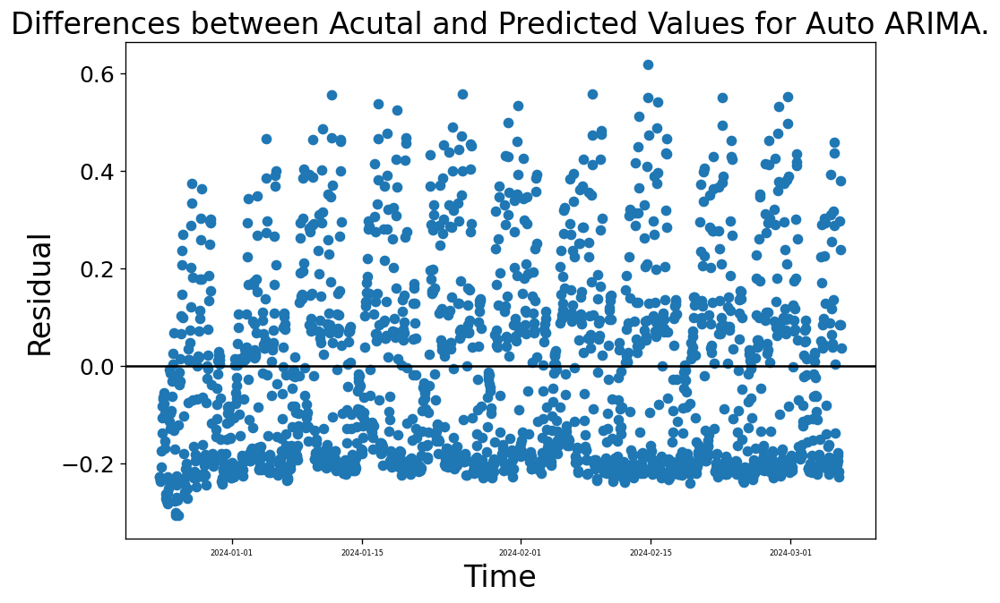

In [ ]:
residual_ARIMA_v1 = np.array(predictions) - test_v1
plt.scatter(selected_df['Hour'][size:], residual_ARIMA_v1)
plt.axhline(y=0, color = 'black')
plt.title("Differences between Acutal and Predicted Values for Auto ARIMA.",
          fontsize = 20)
plt.xlabel("Time", fontsize = 20)
plt.ylabel("Residual", fontsize = 20)
plt.show()

## Plot forecasts against actual outcomes.

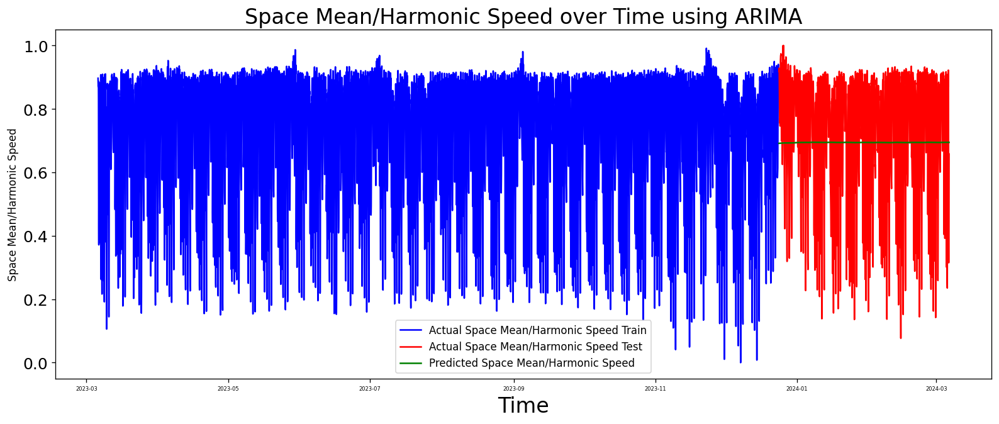

In [ ]:
plt.figure(figsize=(16,6))
plt.plot(selected_df['Hour'][:size], train_v1, color='blue',
         label='Actual {0} Train'.format(feature))
plt.plot(selected_df['Hour'][size:], test_v1, color='red',
         label='Actual {0} Test'.format(feature))
plt.plot(selected_df['Hour'][size:], predictions, color='green',
         label='Predicted {0}'.format(feature))
plt.xlabel('Time', fontsize = 20)
plt.ylabel(feature)
plt.title("{0} over Time using ARIMA".format(feature), fontsize = 20)
plt.legend()
plt.show()

## Forecasting Future Results.

In [ ]:
#forecast_ARIMA_v1 = []
#forecast_result_ARIMA_v1 = forecast_data(Xin, model, forecast_ARIMA_v1,
#                                        future)

# AutoARIMA Model.

The model was trained using https://medium.com/analytics-vidhya/assessment-of-accuracy-metrics-for-time-series-forecasting-bc115b655705

In [ ]:
input_df = pd.DataFrame({'unique_id': [1.0]*selected_df.shape[0],
                         'ds': selected_df['Hour'],
                         'y': selected_df[feature_norm]})
input_df

,unique_id,ds,y
0,1.0,2023-03-06 00:00:00,0.896983
1,1.0,2023-03-06 01:00:00,0.882088
2,1.0,2023-03-06 02:00:00,0.871538
3,1.0,2023-03-06 03:00:00,0.883895
4,1.0,2023-03-06 04:00:00,0.887342
...,...,...,...
8790,1.0,2024-03-06 07:00:00,0.397474
8791,1.0,2024-03-06 08:00:00,0.315210
8792,1.0,2024-03-06 09:00:00,0.456477
8793,1.0,2024-03-06 10:00:00,0.609496


In [ ]:
size = int(len(X) * 0.8)
train_v2, test_v2 = input_df[:size], input_df[size:]

## Create and Train Model.

In [ ]:
# Define the season length as 12 months for monthly data
season_length = 24

# Define a list of models for forecasting
models = [AutoARIMA(season_length=season_length)] # ARIMA model with automatic order selection and seasonal component

# Instantiate the StatsForecast class with models, data frequency
# ('M' for monthly), and parallel computation on all CPU cores (n_jobs=-1)
forecast = StatsForecast(
    models=models, # models for forecasting
    freq='H',  # frequency of the data
    n_jobs=-1  # number of jobs to run in parallel, -1 means using all processors
)

print(forecast)
# Fit the forecasting models to the training data
print(forecast.fit(train_v2))
#forecast_autoARIMA = forecast.fit(train_v2)
#print(forecast_autoARIMA)

# Perform the forecast for the length of the test data
prediction = forecast.predict(h=len(test_v2))

# Merge the test data with the forecasted values
final_test_data = pd.merge(test_v2, prediction)

# Display the first few rows of the merged data
final_test_data.head()

StatsForecast(models=[AutoARIMA])
StatsForecast(models=[AutoARIMA])


,unique_id,ds,y,AutoARIMA
0,1.0,2023-12-24 05:00:00,0.918907,0.925166
1,1.0,2023-12-24 06:00:00,0.919907,0.904762
2,1.0,2023-12-24 07:00:00,0.928447,0.898695
3,1.0,2023-12-24 08:00:00,0.925952,0.885920
4,1.0,2023-12-24 09:00:00,0.899342,0.846795


In [ ]:
prediction

## Plot forecasts against actual outcomes.

In [ ]:
plt.figure(figsize=(16,6))
plt.plot(final_test_data['ds'], final_test_data['y'], color='blue',
         label='Actual {0}'.format(feature))
plt.plot(final_test_data['ds'], final_test_data['AutoARIMA'], color='red',
         label='Predicted {0}'.format(feature))
plt.xlabel('Time', fontsize = 20)
plt.ylabel(feature, fontsize = 20)
plt.title("{0} over Time using ARIMA".format(feature), fontsize = 20)
plt.legend()
plt.show()

## Evaluation

In [ ]:
arima_mae_auto = mean_absolute_error(final_test_data['y'],
                                final_test_data['AutoARIMA'])
print("MAE of AutoARIMA Statistical model = ", arima_mae_auto)
arima_rmse_auto =  mean_squared_error(final_test_data['y'],
                                 final_test_data['AutoARIMA']) ** 0.5
print("RMSE of AutoARIMA Statistical model = ", arima_rmse_auto)
#arima_r2_auto = r2_score(final_test_data['y'], final_test_data['AutoARIMA'])
#print("R^2 Score of ARIMA Statistical model = ", arima_r2_auto)
arima_mape_auto = 100*mean_absolute_percentage_error(final_test_data['y'],
                                                 final_test_data['AutoARIMA'])
print("MAPE Score of AutoARIMA Statistical model = {0} % ".
      format(arima_mape_auto))

## Residual Plots.

In [ ]:
actual_arr_autoARIMA = np.array(final_test_data['y'])
predicted_arr_autoARIMA = np.array(final_test_data['AutoARIMA'])
residuals_autoARIMA = predicted_arr_autoARIMA - actual_arr_autoARIMA
plt.scatter(final_test_data['ds'], residuals_autoARIMA)
plt.axhline(y=0, color = 'black')
plt.title("Differences between Acutal and Predicted Values for Auto ARIMA.",
          fontsize = 20)
plt.xlabel("Time", fontsize = 20)
plt.ylabel("Residual", fontsize = 20)
plt.show()

From the residual plots for the Auto ARIMA model, it can be concluded that the ARIMA model is a good fit. All of the residual plots were created to verify that the R2 values shown are reasonable.

## Forecasting Future Results

In [ ]:
forecast_Auto_ARIMA = []
forecast_result_auto_ARIMA = forecast_data(Xin, cnn_gru_model, forecast_CNN_GRU,
                                        future)

## Energy Consumption

In [ ]:
'''# estimate model energy
energy_rnn = keras_spiking.ModelEnergy(rnn_model, example_data=None)
energy_rnn.summary(print_warnings=False)'''

In [ ]:
'''energy_cnn_rnn.summary(
    columns=(
        "name",
        "energy cpu",
        "energy gpu",
        "synop_energy cpu",
        "synop_energy gpu",
        "neuron_energy cpu",
        "neuron_energy gpu",
    ),
    print_warnings=False,
)'''

# ARIMA Method Version 2.

## Create and Train Model.

In [ ]:
# Re-train ARIMA
model = ARIMA(selected_df[feature_norm], order=(p, d, q))
#model = ARIMA(selected_df[feature_norm], order=(0, 0, 0))
Ar = model.fit()

# Forecast
fc = Ar.get_forecast(test_v1.shape[0]).summary_frame()
# fc_conf_int = fc.conf_int(alpha=0.05)
fc = pd.DataFrame(fc).rename({'mean':'#{0}'.format(feature_norm)},axis=1)
fc

## Plot forecasts against actual outcomes.

In [ ]:
fig, ax = plt.subplots(figsize=(12,6))
plt.plot(np.array(range(size)), train_v1, label='train time series')
plt.plot(np.array(range(size, selected_df.shape[0])), test_v1, label='test time series')
plt.plot(np.array(range(size, selected_df.shape[0])), fc['#{0}'.format(feature_norm)], label='forecast time series')
plt.fill_between(np.array(range(size, selected_df.shape[0])), fc['mean_ci_lower'], fc['mean_ci_upper'],
                 color='k', alpha=.15)
#plt.ylim(0, 0.1)
location = 'upper left'
#location = 'lower right'
plt.legend(loc=location)
plt.show()

## Evaluation

In [ ]:
arima_mae_v2 = mean_absolute_error(test_v1, fc['#{0}'.format(feature_norm)])
print("MAE of ARIMA Statistical model Version 2 = ", arima_mae_v2)
arima_rmse_v2 =  mean_squared_error(test_v1,
                                    fc['#{0}'.format(feature_norm)]) ** 0.5
print("RMSE of ARIMA Statistical model Version 2= ", arima_rmse_v2)
#arima_r2_v2 = r2_score(test_v1, fc['#{0}'.format(feature_norm)])
#print("R^2 Score of ARIMA Statistical model = ",arima_r2_v2)
arima_mape_v2 = 100*mean_absolute_percentage_error(test_v1,
                                               fc['#{0}'.format(feature_norm)])
print("MAPE Score of ARIMA Statistical model Version 2 = {0} % ".
      format(arima_mape_v2))

## Residual Plots

In [ ]:
actual_arr_ARIMA_v2 = np.array(test_v1)
predicted_arr_ARIMA_v2 = np.array(fc['#{0}'.format(feature_norm)])
residuals_autoARIMA = predicted_arr_ARIMA_v2 - actual_arr_ARIMA_v2
plt.scatter(selected_df['Hour'][size:], residuals_autoARIMA)
plt.axhline(y=0, color = 'black')
plt.title("Differences between Acutal and Predicted Values for ARIMA Version 2.",
          fontsize = 20)
plt.xlabel("Time", fontsize = 20)
plt.ylabel("Residual", fontsize = 20)
plt.show()

## Energy Consumption

In [ ]:
'''# estimate model energy
energy_rnn = keras_spiking.ModelEnergy(rnn_model, example_data=None)
energy_rnn.summary(print_warnings=False)'''

In [ ]:
'''energy_cnn_rnn.summary(
    columns=(
        "name",
        "energy cpu",
        "energy gpu",
        "synop_energy cpu",
        "synop_energy gpu",
        "neuron_energy cpu",
        "neuron_energy gpu",
    ),
    print_warnings=False,
)'''